In [32]:
import pandas as pd
import numpy as np
np.random.seed(0)
import os, re
from collections import defaultdict,Counter
from multiprocessing.dummy import Pool
from string import ascii_uppercase
from string import ascii_lowercase
import subprocess, sys, getopt
import math, copy
from statsmodels.formula.api import ols
import linecache
from itertools import combinations
import random,itertools
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import MultipleLocator
from matplotlib.ticker import MaxNLocator
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from scipy import stats
from joblib import Parallel, delayed
import statsmodels.api as sm
import joblib, json
import time
from pdb_profiling.utils import expand_interval
from pdb_profiling.cython.cyrange import overlap_range, subtract_range, isin_range ###overlap是取交集，subtract是取b中不存在于a的差集
# from pandarallel import pandarallel
from scipy.stats import pearsonr,spearmanr
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
from scipy.stats import linregress
from sklearn.metrics import mean_squared_error
def new_round(number, decimal):
    if str(format(number,'.'+str(decimal+1)+'f'))[-1] == '5':
        return format(round(float(str(number)[:-1]+'6'), decimal),'.'+str(decimal)+'f')
    else:
        return format(round(number, decimal),'.'+str(decimal)+'f')

In [18]:
def remove_overlap(x,y):
    tmp = copy.deepcopy(x)
    tmp1 = tmp[~tmp['uni_mut'].isin(y['uni_mut'])]
    tmp1 = tmp1[~tmp1['pdb_mut'].isin(y['pdb_mut'])]
    tmp2 = tmp[tmp['uni_mut'].isin(y['uni_mut'])]
    tmp3 = tmp[tmp['pdb_mut'].isin(y['pdb_mut'])]
    tmp4 = pd.concat([tmp2,tmp3]).drop_duplicates()
    return tmp1,tmp4

In [52]:
## 需要使用的hittner和fisher检验时，需要在python导入R环境使用对应的R库
import os
os.environ['R_HOME'] = '/data/jiang/anaconda3/envs/renv/lib/R'

import rpy2.robjects as robjects

# Initialize R interface
robjects.r('''
    # Load necessary libraries
    library(cocor)
    #library(pROC)
''')

'cocor','tools','stats',...,'datasets','methods','base'


In [54]:
r = robjects.r
r('''library(cocor)''')
def get_hittner2003(aa,bb,cc,nn):##相同数据
    robjects.globalenv['a'] = float(aa)
    robjects.globalenv['b'] = float(bb)
    robjects.globalenv['c'] = float(cc)
    robjects.globalenv['num'] = int(nn)
    result = r('''cocor.dep.groups.overlap(r.jk=a, r.jh=b, r.kh=c, n=num, alternative = "two.sided",test = "hittner2003")''')
    hittner_value = float([line for line in str(result).split('\n') if 'p-value = ' in line][0].strip().split('p-value =')[1].strip())
    return hittner_value
def get_fisher1925(aa,bb,nn1,nn2):##不同数据
    robjects.globalenv['a'] = float(aa)
    robjects.globalenv['b'] = float(bb)
    robjects.globalenv['n1'] = int(nn1)
    robjects.globalenv['n2'] = int(nn2)
    result = r('''cocor.indep.groups(r1.jk=a, r2.hm=b, n1=n1, n2=n2, alternative = "two.sided",test = "fisher1925")''')
    fisher_pvalue = float([line for line in str(result).split('\n') if 'p-value = ' in line][0].strip().split('p-value =')[1].strip())
    return fisher_pvalue

In [68]:
def convert_pvalue_to_stars(pvalue):
    suffix = ''
    if pvalue<0.005:
        suffix = '**'
    if 0.005<=pvalue<0.05:
        suffix = suffix+'*'
    return suffix

def convert_pvalues_to_stars(pvalue1,pvalue2):###pvalue1为与0比，pvalue2为与其它方法比
    suffix1 = convert_pvalue_to_stars(pvalue1)
    suffix2 = convert_pvalue_to_stars(pvalue2)
    return suffix1+'/'+suffix2

本文件旨在整理所有绘图代码，包括BindPPI课题和PremPS综述中所有的图表，使用时参考具体绘图时的代码，由于课题需要，绘图程序中可能涉及一些课题相关的文件处理操作，这一部分可以忽略，仅参考绘图部分即可。

## BindPPI

In [81]:
f802 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_withallpred-230703.txt',sep='\t')
f192 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_withallpred-230703.txt',sep='\t')
f108 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_withallpred-230703.txt',sep='\t')
f365 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_withallpred-230703.txt',sep='\t')

f192_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_rf13_7000.txt',sep='\t')
f108_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_rf13_7000.txt',sep='\t')
f365_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_rf13_7000.txt',sep='\t')
f802_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_rf13_7000.txt',sep='\t')

f192_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_rf13_2000.txt',sep='\t')
f108_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_rf13_2000.txt',sep='\t')
f365_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_rf13_2000.txt',sep='\t')
f802_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_rf13_2000.txt',sep='\t')

f802 = f802.merge(f802_7000,how='left').merge(f802_2000,how='left')
f192 = f192.merge(f192_7000,how='left').merge(f192_2000,how='left')
f108 = f108.merge(f108_7000,how='left').merge(f108_2000,how='left')
f365 = f365.merge(f365_7000,how='left').merge(f365_2000,how='left')
f300 = pd.concat([f192,f108],axis = 0)
f665 = pd.concat([f192,f108,f365],axis = 0)
f802['mlp5120'] = f802['pred_mean']
f192['mlp5120'] = f192['pred_mean']
f108['mlp5120'] = f108['pred_mean']
f365['mlp5120'] = f365['pred_mean']
f300 = pd.concat([f192,f108],axis = 0)
f665 = pd.concat([f192,f108,f365],axis = 0)

### Figure3

In [ ]:
## 文件处理（可忽略）

In [48]:
change_name = {
    'mlp5120': 'MLP_{5120}',
    'pred_mean': 'MLP_{5120}',
    'resnet5120': 'SC_{5120}',
    'mult5120': 'MHA_{5120}',
    'rf5120': 'RF_{5120}',
    'xgb5120': 'XGBoost_{5120}',
    'rf293': 'RF_{293}',
    'xgb293': 'XGBoost_{293}',
    'rf13': 'RF_{13}',
    'rf174': 'RF_{174}',
    'rf1428': 'RF_{1428}',
    'xgb13': 'XGBoost_{13}',
    'mlp13': 'MLP_{13}',
    'mlp174': 'MLP_{174}',
    'mlp1428': 'MLP_{1428}',
#     r"average_('Best_seq', 'RF_13')": 'A_MLP_{5120},RF_{13}',
#     r"Waverage_('Best_seq', 'RF_13')": 'W_MLP_{5120},RF_{13}',
#     'rf_stack': 'RF_MLP_{5120},RF_{13}',
#     r"lr_('Best_seq', 'RF_13')": 'LR_MLP_{5120},RF_{13}',
#     r"average_('Best_seq', 'RF_13')": 'Averaging Ensemble',
#     r"Waverage_('Best_seq', 'RF_13')": 'Weighted Ensemble',
#     'rf_stack': 'Random Forest',
#     r"lr_('Best_seq', 'RF_13')": 'Linear regression',
    r"average_('Best_seq', 'RF_13')": 'AvgEns',
    r"Waverage_('Best_seq', 'RF_13')": 'WtdAvgEns',
    'rf_stack': 'RFEns',
    r"lr_('Best_seq', 'RF_13')": 'LREns',
    'mlp5120+13': 'MLP_{5120, 13}',
    'mlp5120+174': 'MLP_{5120, 174}',
    'mlp5120+1428': 'MLP_{5120, 1428}',
    '1_16_4_256': 'MLP_{5120////256, 13/208}',
    '2_16_4_256': 'MLP_{5120////256, 13//208}',
    '1_32_3_512': 'MLP_{5120///512, 13/416}',
    '2_32_3_512': 'MLP_{5120///512, 13//416}',
    'rf5120_13': 'RF_{5120, 13}',
    'rf5120_174': 'RF_{5120, 174}',
    'rf5120_1428': 'RF_{5120, 1428}',
    'PPI-Affinity':'PPI-Affinity',
    'PPA_Pred2':'PPA_Pred2',
    'Minpredictor':'Minpredictor',
    'prodigy':'PRODIGY',
    'ISLAND':'ISLAND',
    'dG':'∆G'
}
seq_trad = ['rf5120', 'xgb5120']
seq_deep = ['mlp5120', 'pred_mean', 'resnet5120', 'mult5120']
str_trad = ['rf13', 'rf174', 'rf1428', 'xgb13']
str_deep = ['mlp13', 'mlp174', 'mlp1428']
ensemble = [
    r"average_('Best_seq', 'RF_13')",
    r"Waverage_('Best_seq', 'RF_13')",
    r"lr_('Best_seq', 'RF_13')",
    "rf_stack"
]
fused_deep = [
    'mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256', '2_32_3_512'
]
fused_trad = ['rf5120_13', 'rf5120_174', 'rf5120_1428']

seq_methods = seq_trad + seq_deep
str_methods = str_trad + str_deep
ensemble_methods = ensemble
fused_methods = fused_trad + fused_deep

first_method = [r"average_('Best_seq', 'RF_13')"]
other_method = ['rf13','pred_mean','rf5120','rf293','xgb13','mlp13','rf174', 'rf1428','mlp174','mlp1428',r"Waverage_('Best_seq', 'RF_13')",'rf_stack',r"lr_('Best_seq', 'RF_13')",'rf5120_13','rf5120_174','rf5120_1428','mlp5120+13',\
                'mlp5120+174','mlp5120+1428', '1_16_4_256', '2_16_4_256', '1_32_3_512', '2_32_3_512']
results = []
for method1 in first_method :
#     for method1 in first_method:
    cv_pcc,_ = pearsonr(np.array(f802['dG']),np.array(f802[method1]))
    cv_rmse = new_round(mean_squared_error(np.array(f802['dG']),np.array(f802[method1]))**0.5,2)
    f192_pcc,_ = pearsonr(np.array(f192['dG']),np.array(f192[method1]))
    f192_rmse = new_round(mean_squared_error(np.array(f192['dG']),np.array(f192[method1]))**0.5,2)
    f365_pcc,_ = pearsonr(np.array(f365['dG']),np.array(f365[method1]))
    f365_rmse = new_round(mean_squared_error(np.array(f365['dG']),np.array(f365[method1]))**0.5,2)
    f108_pcc,_ = pearsonr(np.array(f108['dG']),np.array(f108[method1]))
    f108_rmse = new_round(mean_squared_error(np.array(f108['dG']),np.array(f108[method1]))**0.5,2)
    f665_pcc,_ = pearsonr(np.array(f665['dG']),np.array(f665[method1]))
    f665_rmse = new_round(mean_squared_error(np.array(f665['dG']),np.array(f665[method1]))**0.5,2)
    f300_pcc,_ = pearsonr(np.array(f300['dG']),np.array(f300[method1]))
    f300_rmse = new_round(mean_squared_error(np.array(f300['dG']),np.array(f300[method1]))**0.5,2)
    cv_pcc = new_round(cv_pcc,2)
    f192_pcc = new_round(f192_pcc,2)
    f365_pcc = new_round(f365_pcc,2)
    f108_pcc = new_round(f108_pcc,2)
    f665_pcc = new_round(f665_pcc,2)
    f300_pcc = new_round(f300_pcc,2)
    results.append({
        "model": method1,
        "cv_pcc": cv_pcc, "cv_rmse": cv_rmse, 
        "f192_pcc": f192_pcc, "f192_rmse": f192_rmse,
        "f108_pcc": f108_pcc, "f108_rmse": f108_rmse,
        "f365_pcc": f365_pcc, "f365_rmse": f365_rmse,
        "f300_pcc": f300_pcc, "f300_rmse": f300_rmse,
        "f665_pcc": f665_pcc, "f665_rmse": f665_rmse})
## 显著性比较:
for method2 in other_method:
    cv_pcc,_ = pearsonr(np.array(f802['dG']),np.array(f802[method2]))
    cv_rmse = new_round(mean_squared_error(np.array(f802['dG']),np.array(f802[method2]))**0.5,2)
    f192_pcc,_ = pearsonr(np.array(f192['dG']),np.array(f192[method2]))
    f192_rmse = new_round(mean_squared_error(np.array(f192['dG']),np.array(f192[method2]))**0.5,2)
    f365_pcc,_ = pearsonr(np.array(f365['dG']),np.array(f365[method2]))
    f365_rmse = new_round(mean_squared_error(np.array(f365['dG']),np.array(f365[method2]))**0.5,2)
    f108_pcc,_ = pearsonr(np.array(f108['dG']),np.array(f108[method2]))
    f108_rmse = new_round(mean_squared_error(np.array(f108['dG']),np.array(f108[method2]))**0.5,2)
    f665_pcc,_ = pearsonr(np.array(f665['dG']),np.array(f665[method2]))
    f665_rmse = new_round(mean_squared_error(np.array(f665['dG']),np.array(f665[method2]))**0.5,2)
    f300_pcc,_ = pearsonr(np.array(f300['dG']),np.array(f300[method2]))
    f300_rmse = new_round(mean_squared_error(np.array(f300['dG']),np.array(f300[method2]))**0.5,2)
    cv_pcc = new_round(cv_pcc,2)
    f192_pcc = new_round(f192_pcc,2)
    f365_pcc = new_round(f365_pcc,2)
    f108_pcc = new_round(f108_pcc,2)
    f665_pcc = new_round(f665_pcc,2)
    f300_pcc = new_round(f300_pcc,2)

    results.append({
        "model": method2,
        "cv_pcc": cv_pcc, "cv_rmse": cv_rmse, 
        "f192_pcc": f192_pcc, "f192_rmse": f192_rmse,
        "f108_pcc": f108_pcc, "f108_rmse": f108_rmse,
        "f365_pcc": f365_pcc, "f365_rmse": f365_rmse,
        "f300_pcc": f300_pcc, "f300_rmse": f300_rmse,
        "f665_pcc": f665_pcc, "f665_rmse": f665_rmse
         })
all_method_df = pd.DataFrame(results)
all_method_df

In [ ]:
## 绘图部分

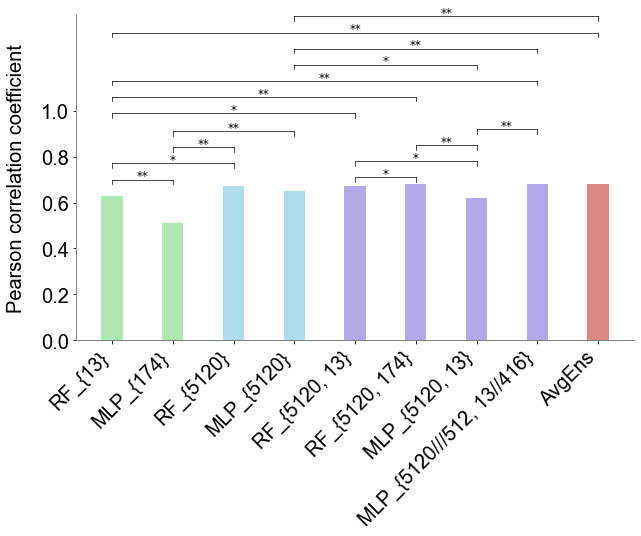

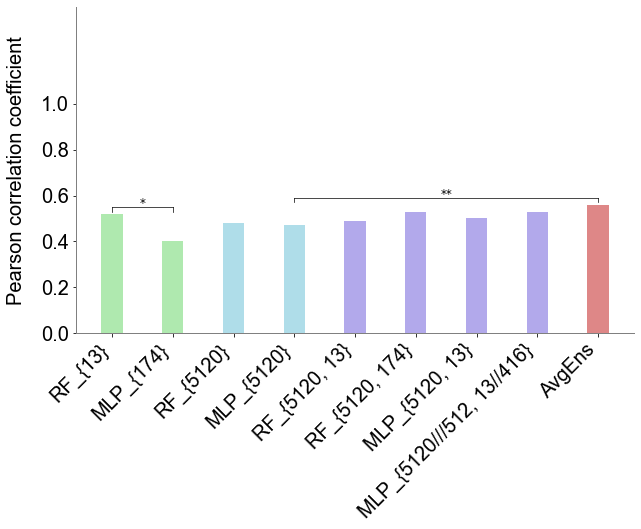

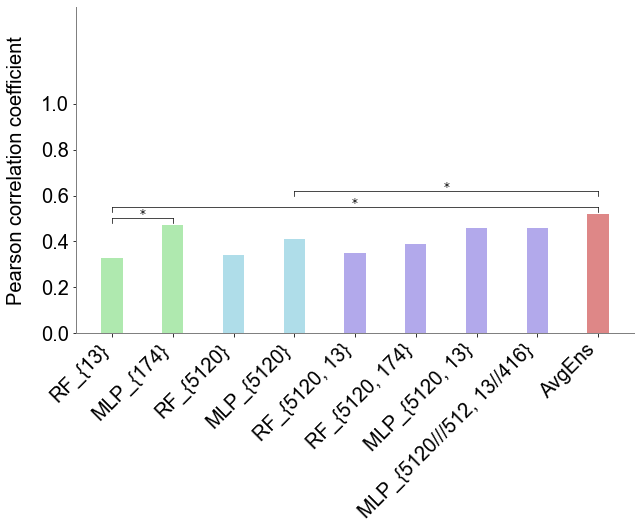

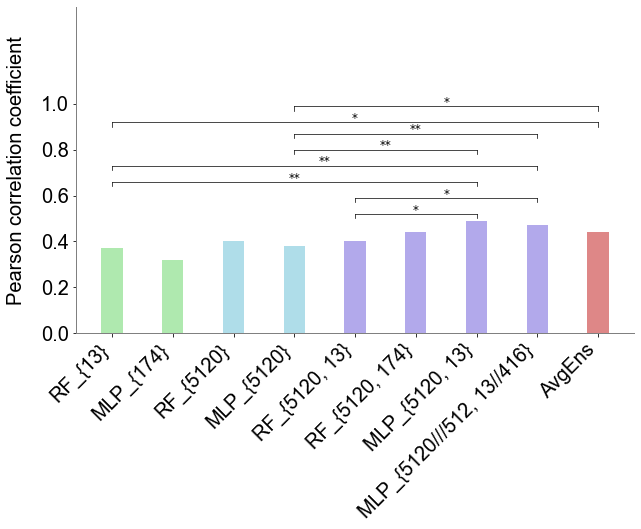

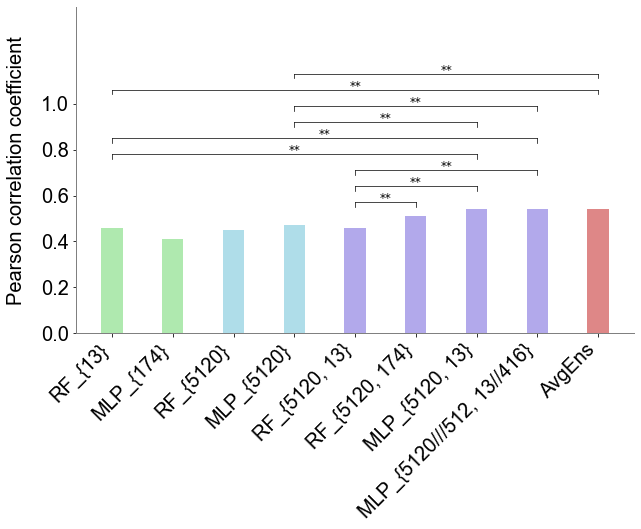

In [55]:
method9 = ['rf13','mlp174','rf5120','pred_mean','rf5120_13','rf5120_174','mlp5120+13','2_32_3_512',r"average_('Best_seq', 'RF_13')"]
method9_color = ['#f9ac61','#ffbb78','#67c2a5','#abd979','#93c6e5','#6ea8ee','#1f77b4','#4877b4','#f16a4d']
method9_color_dict = {
    'rf13':'#afe9af',
    'mlp174':'#afe9af',
    'rf5120':'#afdde9',
    'pred_mean':'#afdde9',
    'rf5120_13':'#b2a9eb',
    'rf5120_174':'#b2a9eb',
    'mlp5120+13':'#b2a9eb',
    '2_32_3_512':'#b2a9eb',
    r"average_('Best_seq', 'RF_13')":'#de8787',
}
# method9_color_dict = {
#     'rf13':'#93cc82',
#     'mlp174':'#93cc82',
#     'rf5120':'#99cbeb',
#     'pred_mean':'#99cbeb',
#     'rf5120_13':'#c2abd9',
#     'rf5120_174':'#c2abd9',
#     'mlp5120+13':'#c2abd9',
#     '2_32_3_512':'#c2abd9',
#     r"average_('Best_seq', 'RF_13')":'#de8787',
# }
# method9_color_dict2 = {
#     'rf13':'darkgreen',
#     'mlp174':'darkgreen',
#     'rf5120':'#1663A9',
#     'pred_mean':'#1663A9',
#     'rf5120_13':'#614099',
#     'rf5120_174':'#614099',
#     'mlp5120+13':'#614099',
#     '2_32_3_512':'#614099',
#     r"average_('Best_seq', 'RF_13')":'#9e343b',
# }


seq_trad = ['rf5120', 'xgb5120']
seq_deep = ['pred_mean', 'resnet5120', 'mult5120']
str_trad = ['rf13', 'rf174', 'rf1428', 'xgb13']
str_deep = ['mlp13', 'mlp174', 'mlp1428']
ensemble = ["average_('Best_seq', 'RF_13')", "Waverage_('Best_seq', 'RF_13')", "lr_('Best_seq', 'RF_13')", "rf_stack"]
fused_deep = ['mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256', '2_32_3_512']
fused_trad = ['rf5120_13', 'rf5120_174', 'rf5120_1428']

# for data,name in zip(['cv_pcc','f192_pcc','f108_pcc','f365_pcc','f665_pcc'],['S802','S192','S108','S365','S665']):
for data,name,datase in zip(['cv_pcc','f192_pcc','f108_pcc','f365_pcc','f665_pcc'],['S802','S192','S108','S365','S665'],[f802,f192,f108,f365,f665]):
    model_tmp = method9
    pcc_list = []
    pcc_dict = {}
    for method in model_tmp:
        pcc_values = all_method_df[all_method_df['model'] == method][data].values
        pcc_list.append(float(pcc_values))
        pcc_dict[method] = float(pcc_values)
        
    dataset = copy.deepcopy(datase)
    num_methods = len(model_tmp)
    p_values = np.zeros((num_methods, num_methods))
    pcc_values = np.zeros((num_methods, num_methods))

    for i, method1 in enumerate(model_tmp):
        for j, method2 in enumerate(model_tmp):
            pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
            pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
            pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

            p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
            p_values[i, j] = p_value
            pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
    # 设置图形的大小
    plt.figure(figsize=(10, 6))

    # 生成x轴刻度和柱状图位置
    x = np.arange(len(model_tmp))
    bar_width = 0.35
    
    seq_trad = ['rf5120', 'xgb5120']
    seq_deep = ['mlp5120', 'pred_mean', 'resnet5120', 'mult5120']
    str_trad = ['rf13', 'rf174', 'rf1428', 'xgb13']
    str_deep = ['mlp13', 'mlp174', 'mlp1428']
    ensemble = [
        r"average_('Best_seq', 'RF_13')",
        r"Waverage_('Best_seq', 'RF_13')",
        r"lr_('Best_seq', 'RF_13')",
        "rf_stack"
    ]
    fused_deep = [
        'mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256', '2_32_3_512'
    ]
    fused_trad = ['rf5120_13', 'rf5120_174', 'rf5120_1428']

    seq_methods = seq_trad + seq_deep
    str_methods = str_trad + str_deep
    ensemble_methods = ensemble
    fused_methods = fused_trad + fused_deep
#     colors = ['#f9ac61','#67c2a5','#f16a4d','#6ea8ee']
# #         colors = ['darkgreen','darkorange','red','blue']
#     color_list = []
#     for i in method9:
#         if i in seq_methods:
#             color_list.append(colors[1])
#         if i in str_methods:
#             color_list.append(colors[0])
#         if i in ensemble_methods:
#             color_list.append(colors[2])
#         if i in fused_methods:
#             color_list.append(colors[3])
    color_list = [method9_color_dict[i] for i in method9]
    # 绘制柱状图
    plt.bar(x, pcc_list, width=bar_width, label=name,color = color_list)

    # 添加刻度标签
    plt.xticks(x, [change_name[i] for i in model_tmp],fontsize=20, rotation=45,fontname='Arial',ha='right')#weight='bold'
#     plt.xlabel('Method')
    plt.yticks([i/10 for i in range(0,11,2)],fontsize=20,fontname='Arial')#,weight='bold'
    plt.ylabel('Pearson correlation coefficient',fontsize=20,fontname='Arial',labelpad=15)
    
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    y_offset = 0.03
    linewidth = 0.7
    starsize = 12
    if name in ['S802']:
        plt.ylim([0,1.42])
    if name in ['S192']:
        plt.ylim([0,1.42])
    if name in ['S108']:
        plt.ylim([0,1.42])
    if name in ['S365']:
        plt.ylim([0,1.42])
    if name in ['S665']:
        plt.ylim([0,1.42])
#     if name in ['S192']:
#         plt.ylim([0,0.6])
#     if name in ['S108']:
#         plt.ylim([0,0.63])
#     if name in ['S365']:
#         plt.ylim([0,1])
#     if name in ['S600']:
#         plt.ylim([0,0.8])

    ### 前四个先画
    count_offset = 0
    significance_level = 0.05  # 显著性水平
    max_value = max(pcc_dict[model1] for model1 in model_tmp[:4])
    for i in range(len(model_tmp[:4])):
        for j in range(i+1, len(model_tmp[:4])):  # 仅对未标注过的模型进行比较
            model1 = model_tmp[i]
            model2 = model_tmp[j]
            p_value = p_values[i, j]
            if p_value < significance_level: 
                x_pos = [i, j]
                y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
                plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
                width1 = 0.02
                x_pos1 = [i, i]
                y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
                plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
                x_pos2 = [j, j]
                y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
                plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
                ##################
                count_offset += 0.07
                # 在直线中心位置添加文本标注
                x_center = sum(x_pos) / 2
                y_center = sum(y_pos) / 2
                if p_value < 0.005:
                    plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = starsize)
                else:
                    plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = starsize)
    ### 中间四个先画
    count_offset = 0
    significance_level = 0.05  # 显著性水平
    max_value = max(pcc_dict[model1] for model1 in model_tmp[4:-1])
    for i in range(4,4+len(model_tmp[4:-1])):
        for j in range(i+1, 4+len(model_tmp[4:-1])):  # 仅对未标注过的模型进行比较
            model1 = model_tmp[i]
            model2 = model_tmp[j]
            p_value = p_values[i, j]
            if p_value < significance_level: 
                x_pos = [i, j]
                y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
                plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
                width1 = 0.02
                x_pos1 = [i, i]
                y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
                plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
                x_pos2 = [j, j]
                y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
                plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
                count_offset += 0.07
                # 在直线中心位置添加文本标注
                x_center = sum(x_pos) / 2
                y_center = sum(y_pos) / 2
                if p_value < 0.005:
                    plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = starsize)
                else:
                    plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = starsize)

    ## 前四个和中间四个

#     count_offset = 0
    significance_level = 0.05  # 显著性水平
    max_value = max(pcc_dict[model1] for model1 in model_tmp[:-1])
    for i in range(4):
        for j in range(4,8):  # 仅对未标注过的模型进行比较
            model1 = model_tmp[i]
            model2 = model_tmp[j]
            if (model1 in ['rf13','pred_mean']) & (model2 in [ 'rf5120_13','rf5120_174','mlp5120+13','2_32_3_512']):
                p_value = p_values[i, j]
                if p_value < significance_level: 
                    x_pos = [i, j]
                    y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
                    plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
                    width1 = 0.02
                    x_pos1 = [i, i]
                    y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
                    plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
                    x_pos2 = [j, j]
                    y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
                    plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
                    count_offset += 0.07
                    # 在直线中心位置添加文本标注
                    x_center = sum(x_pos) / 2
                    y_center = sum(y_pos) / 2
                    if p_value < 0.005:
                        plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = starsize)
                    else:
                        plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = starsize)
                    ## 中括号

                    
    method3 = ['rf13','pred_mean',r"average_('Best_seq', 'RF_13')"]          
#     ### 最后一个和其他
    method4 = method3 + ['2_32_3_512']
    max_value = max(pcc_dict[model1] for model1 in method4)
    i = 8
    for j in range(len(model_tmp[:-1])):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        if (model1 in method4) & (model2 in method4):
            p_value = p_values[i, j]
            if p_value < significance_level: 
                x_pos = [i, j]
                y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
                plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
                width1 = 0.02
                x_pos1 = [i, i]
                y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
                plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
                x_pos2 = [j, j]
                y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
                plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
                count_offset += 0.07
                # 在直线中心位置添加文本标注
                x_center = sum(x_pos) / 2
                y_center = sum(y_pos) / 2
                if p_value < 0.005:
                    plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = starsize)
                else:
                    plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = starsize)


                    
                    
                    
#     max_value = max(pcc_dict[model1] for model1 in model_tmp)
#     i = 8
#     for j in range(len(model_tmp[:-1])):  # 仅对未标注过的模型进行比较
#         model1 = model_tmp[i]
#         model2 = model_tmp[j]
#         p_value = p_values[i, j]
#         if p_value < significance_level: 
#             y_offset = 0.01
#             x_pos = [i, j]
#             y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
#             plt.plot(x_pos, y_pos, color='black',linestyle='dashed')
#             count_offset += 0.05
#             # 在直线中心位置添加文本标注
#             x_center = sum(x_pos) / 2
#             y_center = sum(y_pos) / 2
#             if p_value < 0.01:
#                 plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center')
#             else:
#                 plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center')
    # 添加图例
#     plt.legend()
#     # 在每个柱形图上方标注数值
#     for i, pcc in enumerate(pcc_list):
#         plt.text(x[i],pcc + 0.005, str(pcc), ha='center')
    # 展示图形
    plt.show()

### Figure 4

In [59]:
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['axes.edgecolor'] = 'grey'
def plot_scatter_subplot(dG_pred_list,dG_list,m,n,o,me1,color = 'black'):
    dash_length = 7  # 虚线长度
    gap_length = 7    # 间隔长度
    dash_interval = dash_length + gap_length  # 虚线间隔
    plt.scatter(dG_pred_list,dG_list,color=color,label=r'$BindPPI$',alpha=1,linewidths=1,s=85,edgecolors='black')
    slope1, intercept1, r1, p1, se1 = linregress(dG_pred_list, dG_list)
    ax1.axline((-10, -10 * slope1+intercept1), slope=slope1,color = color,ls='--',dashes=[dash_length, gap_length])
    
    
#     plt.scatter(dG_pred_list,dG_list,color='black',label=r'$BindPPI$',alpha=1,linewidths=0.3,s=50,edgecolors='white')
#     slope1, intercept1, r1, p1, se1 = linregress(dG_pred_list, dG_list)
#     ax1.axline((-10, -10*slope1+intercept1), slope=slope1,color='black',ls='--')
    ax = plt.gca()
    ## 第一列
#     if n in [1]:
#         ax.text(-0.2,1.13,ha='left',va= 'top',s=ascii_lowercase[m-1]+'.',transform=ax.transAxes,
#                 fontsize=25,fontname='Arial',weight='bold')
    corr,pvalue = pearsonr(dG_pred_list,dG_list)
    pcc_content = ''
    if new_round(corr,2)=='-0.00':
        corr = 0.00
    if pvalue<0.01:
        pcc_content = new_round(corr,2)#+'**'
    if (pvalue>=0.01) & (pvalue<0.05):
        pcc_content = new_round(corr,2)#+'*'
    if pvalue>=0.05:
        pcc_content = new_round(corr,2)
    if pvalue>0.005:
        print(m,n)
    pcc_x,pcc_y = 0.63,0.14
#     if o in [1,5,9]:###空值pcc和rmse显示的位置
#         pcc_x,pcc_y = 0.48,0.14
    ax.text(pcc_x,pcc_y,ha='left',va= 'top',s='PCC = '+ pcc_content,
            transform = ax.transAxes,fontsize=18,fontname='Arial')#,weight='bold'
    ax.text(pcc_x,pcc_y-0.07,ha='left',va= 'top',s='RMSE = '+"%.2f"%
            (mean_squared_error(dG_pred_list,dG_list)**0.5),
            transform=ax.transAxes,fontsize=18,fontname='Arial')#,weight='bold'
    if n in [1]:
        plt.ylabel('$∆G\mathregular{_{Exp}}$ (kcal mol$\mathregular{^{-1}}$)',fontsize=25,fontname='Arial')
#     ax1.set_yticks(range(-20,1,5))
#     if n in [2,3,4,5]:
#         ax1.set_yticks(range(-15,1,5))
    ## 最后一行
    if m in [3]:
        plt.xlabel('$∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}}$)',fontsize=25,fontname='Arial')
    ## 每一列设置自己的ylabel 和 yticks

    
#     if o in [i for i in range(2,25,5)]:
#         ax1.set_yticks((range(-15,1,5)))
#     if o in [3]:
#         ax1.set_xticks(range(-100,101,50))
#     if o in [5]:
#         ax1.set_xticks(range(-60,41,20))
#     if o in [3]:
#         ax1.set_xticks(range(-100,41,20))

In [60]:
# color_list = ['#f9ac61','#67c2a5','#6ea8ee','#ffbb78', '#abd979', '#aec7e8','#ffbb78', '#abd979', '#aec7e8','#ffbb78', '#abd979', '#aec7e8']
method3 = ['rf13',
 'pred_mean',
 "average_('Best_seq', 'RF_13')"]
# method9_color_dict = {
#     'rf13':'#afe9af',
#     'mlp174':'#afe9af',
#     'rf5120':'#afdde9',
#     'pred_mean':'#afdde9',
#     'rf5120_13':'#b2a9eb',
#     'rf5120_174':'#b2a9eb',
#     'mlp5120+13':'#b2a9eb',
#     '2_32_3_512':'#b2a9eb',
#     r"average_('Best_seq', 'RF_13')":'#de8787',
# }
# method9_color_dict2 = {
#     'rf13':'#369F2D',
#     'mlp174':'#369F2D',
#     'rf5120':'#1663A9',
#     'pred_mean':'#1663A9',
#     'rf5120_13':'#614099',
#     'rf5120_174':'#614099',
#     'mlp5120+13':'#614099',
#     '2_32_3_512':'#614099',
#     r"average_('Best_seq', 'RF_13')":'#EE4431',
# }
#绿蓝紫红，前四个画散点图，后四个颜色比较深，可以用来写字
# cols03<-c('#93cc82','#99cbeb','#c2abd9','#de8787',
#           '#369F2D','#1663A9','#614099','#9e343b')
method9_color_dict = {
    'rf13':'#93cc82',
    'mlp174':'#93cc82',
    'rf5120':'#99cbeb',
    'pred_mean':'#99cbeb',
    'rf5120_13':'#c2abd9',
    'rf5120_174':'#c2abd9',
    'mlp5120+13':'#c2abd9',
    '2_32_3_512':'#c2abd9',
    r"average_('Best_seq', 'RF_13')":'#de8787',
}
method9_color_dict2 = {
    'rf13':'darkgreen',
    'mlp174':'darkgreen',
    'rf5120':'#1663A9',
    'pred_mean':'#1663A9',
    'rf5120_13':'#614099',
    'rf5120_174':'#614099',
    'mlp5120+13':'#614099',
    '2_32_3_512':'#614099',
    r"average_('Best_seq', 'RF_13')":'#9e343b',
}
name_list = ['S802','S192','S108','S365','S665']
dataset_list = [f802,f192,f108,f365,f665]
me_list = method3
models_name = [change_name[i]for i in method3]
plt.figure(figsize=(30,54),dpi=500)
o = 0
xaxis_ax1_list,yaxis_ax1_list = [],[]
for m,me in zip(range(1,len(me_list)+1),me_list):
    for n,data,name in zip(range(1,len(dataset_list)+1),dataset_list,name_list):
        o = o+1
        dG_pred_list,dG_list = list(data[me]),list(data['dG'])
#         if (m in [1])&(n in [1]):
#             ax1 = plt.subplot(9,5,o)
#         elif (m in [1])&(n not in [1]):
#             ax1 = plt.subplot(9,5,o,sharey= yaxis_ax1_list[m-1])###子图间共用同一套坐标轴
#         elif (m not in [1])&(n in [1]):
#             ax1 = plt.subplot(9,5,o,sharex=xaxis_ax1_list[n-1])
#         else:
#             ax1 = plt.subplot(9,5,o,sharex=xaxis_ax1_list[n-1],sharey=yaxis_ax1_list[m-1])
        if n in [1]:
            ax1 = plt.subplot(9, 5, o)  # 设置子图间共用同一套坐标轴
            ax1.set_xticks(range(-20, -4, 5),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_xlim(-22,-4)
            ax1.set_yticks(range(-20, 1, 5),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_ylim(-22.5,0)
        elif n in [2]:
            ax1 = plt.subplot(9, 5, o)  # 设置子图间共用同一套坐标轴
            ax1.set_xticks(range(-15, -4, 5),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_xlim(-16,-4)
            ax1.set_yticks(range(-15, 1, 5),fontsize = 15)  # 设置y轴刻度范围为-15到0，步长为5
#             ax1.tick_params(axis='y', labelsize=20)
#             ax.set_yticklabels(range(-15, 1, 5), fontsize=20)
            ax1.set_ylim(-17,-3)
        elif n in [3]:
            ax1 = plt.subplot(9, 5, o)  # 设置子图间共用同一套坐标轴
            ax1.set_xticks(range(-15, -4, 3),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_xlim(-15.5,-7)
            ax1.set_yticks(range(-15, 1, 5),fontsize = 15)  # 设置y轴刻度范围为-15到0，步长为5
            ax1.set_ylim(-17,-4)
        elif n in [4]:
            ax1 = plt.subplot(9, 5, o)  # 设置子图间共用同一套坐标轴
            ax1.set_xticks(range(-15, -4, 3),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_xlim(-15.5,-5)
            ax1.set_yticks(range(-15, 1, 5),fontsize = 15)  # 设置y轴刻度范围为-15到0，步长为5
#             ax1.tick_params(axis='y', labelsize=20)
#             ax.set_yticklabels(range(-15, 1, 5), fontsize=20)
            ax1.set_ylim(-17,-3)
        elif n in [5]:
            ax1 = plt.subplot(9, 5, o)  # 设置子图间共用同一套坐标轴
            ax1.set_xticks(range(-15, -4, 5),fontsize = 15)  # 设置y轴刻度范围为-20到0，步长为5
            ax1.set_xlim(-16,-4)
            ax1.set_yticks(range(-15, 1, 5),fontsize = 15)  # 设置y轴刻度范围为-15到0，步长为5
#             ax1.tick_params(axis='y', labelsize=20)
#             ax.set_yticklabels(range(-15, 1, 5), fontsize=20)
            ax1.set_ylim(-17,-3)

        ax1 = plt.subplot(9,5,o)
        plot_scatter_subplot(dG_pred_list,dG_list,m,n,o,me,color = method9_color_dict[method3[m-1]])

        ax1.tick_params(length=5, width = 1.2)
        if m not in [3]:
            ax1.set_xticklabels(ax1.get_xticks(),color='w',fontname='Arial',fontsize=15)#,fontweight='bold'
        if m in [3]:
            ax1.set_xticklabels(ax1.get_xticks(),fontname='Arial',fontsize=15)#,fontweight='bold'
        if n not in [1]:
            ax1.set_yticklabels(ax1.get_yticks(),color='black',fontname='Arial',fontsize=15)#,fontweight='bold'
        if n in [1]:
            ax1.set_yticklabels(ax1.get_yticks(),fontname = 'Arial',fontsize=15)#,fontweight='bold'
        if o in [1,2,3,4,5]:
            plt.title(name,fontsize=35,fontname='Arial',y=1.02)###标题,weight='bold'
        if m in [1]:
            xaxis_ax1_list.append(ax1)
        if n in [1]:
            yaxis_ax1_list.append(ax1)
        # 在最后一列的右边添加模型信息
        if n in [5]:
            ax1.text(1.10,0.5, models_name[m-1], color = method9_color_dict2[method3[m-1]],ha='right', va='center', fontsize=30, fontname='Arial', rotation=-90,transform=ax1.transAxes)#, fontweight='bold'
    plt.subplots_adjust(hspace=0.05, wspace=0.1)


### Figure 5

In [ ]:
## 文件处理（可忽略）

In [61]:
cols_list = ['rf13','pred_mean',r"average_('Best_seq', 'RF_13')"]
method_list = [change_name[i] for i in cols_list]

benchmark2_raw = pd.read_csv('/data/jiang/affi/data/affi/preprocess/benchmark2_20210402',sep='\t')
ba2_pdbs = list(set(benchmark2_raw['pdb']))
benchmark2_raw['rigid_flex'] = np.where(benchmark2_raw['IRMSD']<=1,'rigid','flex')
benchmark2_raw['rigid_flex'].value_counts()

f802['pdb'] = f802['pdb_chain'].str.split('_').str[0]
f192['pdb'] = f192['pdb_chain'].str.split('_').str[0]
f108['pdb'] = f108['pdb_chain'].str.split('_').str[0]
f365['pdb'] = f365['pdb_chain'].str.split('_').str[0]

f802_ppiad = pd.merge(f802,benchmark2_raw[['pdb','rigid_flex']],how='inner')
f192_ppiad = pd.merge(f192,benchmark2_raw[['pdb','rigid_flex']],how='inner')
f108_ppiad = pd.merge(f108,benchmark2_raw[['pdb','rigid_flex']],how='inner')
f365_ppiad = pd.merge(f365,benchmark2_raw[['pdb','rigid_flex']],how='inner')
f665_ppiad = pd.concat([f192_ppiad,f108_ppiad,f365_ppiad])

s162 = pd.concat([f802_ppiad,f192_ppiad,f108_ppiad,f365_ppiad])

# s164_methods = pd.read_csv('/data/jiang/affi/analysis/s164_methods',sep='\t')
s162_rigid_methods = s162[s162['rigid_flex']=='rigid']
s162_flex_methods = s162[s162['rigid_flex']=='flex']
s162.shape,s162_rigid_methods.shape,s162_flex_methods.shape


# s164_methods = pd.read_csv('/data/jiang/affi/analysis/s164_methods',sep='\t')
s802_rigid_methods = f802_ppiad[f802_ppiad['rigid_flex']=='rigid']
s802_flex_methods = f802_ppiad[f802_ppiad['rigid_flex']=='flex']
f802_ppiad.shape,s802_rigid_methods.shape,s802_flex_methods.shape

method9_color_dict = {
    'rf13':'#93cc82',
    'mlp174':'#93cc82',
    'rf5120':'#99cbeb',
    'pred_mean':'#99cbeb',
    'rf5120_13':'#c2abd9',
    'rf5120_174':'#c2abd9',
    'mlp5120+13':'#c2abd9',
    '2_32_3_512':'#c2abd9',
    r"average_('Best_seq', 'RF_13')":'#de8787',
}

In [ ]:
## 绘图部分

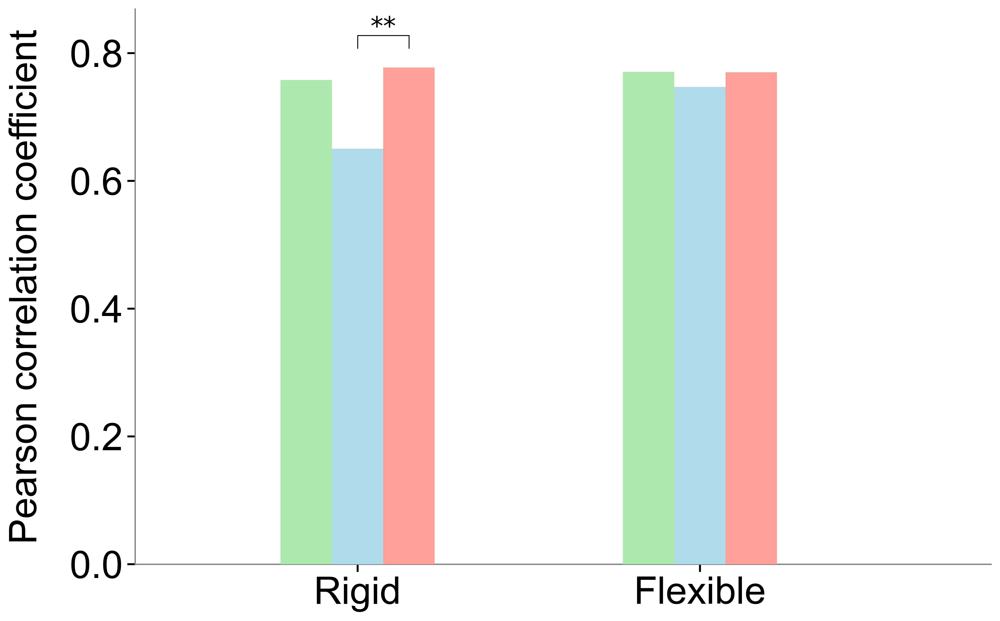

In [69]:
pcc_lists,pcc_lists2,pvalue_lists = [],[],[]
for data1 in [f802_ppiad,s802_rigid_methods,s802_flex_methods]:
    data = copy.deepcopy(data1)
    pcc1,pvalue1 = pearsonr(list(data[cols_list[0]]),list(data['dG']))
    pcc1_info = new_round(pcc1,2)+convert_pvalues_to_stars(pvalue1,1)
    num1 = data.shape[0]
    pcc_list,pcc_list2,pvalue_list = [pcc1],[pcc1_info],[pvalue1]
    for names in cols_list[1:]:
        data = copy.deepcopy(data1)
        name = ''
        if type(names)==list:
            pcc_sub_list = []
            for name1 in names:
                pcc22,pvalue22 = pearsonr(list(data[name1]),list(data['dG']))
                pcc_sub_list.append(pcc22)
            name = names[pcc_sub_list.index(max(pcc_sub_list))]
            print(num1,name)
        else:
            name = names
        pcc2,pvalue2 = pearsonr(list(data[name]),list(data['dG']))
        pcc3 = pearsonr(list(data[cols_list[0]]),list(data[name]))[0]
        hf_pvalue = get_hittner2003(pcc1,pcc2,pcc3,num1)
        pcc2_info = new_round(pcc2,2)#+convert_pvalues_to_stars(pvalue2,hf_pvalue)
        pcc_list.append(pcc2)
        pcc_list2.append(pcc2_info)
        pvalue_list.append(pvalue2)
    pcc_lists.append(pcc_list)
    pcc_lists2.append(pcc_list2)
    pvalue_lists.append(hf_pvalue)
plt.figure(figsize=(12,8),dpi=500)
bar_width = 0.15
num = 2
#['#ade8ad','#addce8','#dd8585']
#['#ade8ad','#addce8','#ffa099']
plt.bar([i for i in range(num)],[i[0] for i in pcc_lists[1:]],bar_width,align="center",color='#ade8ad',edgecolor='none',label=change_name[method3[0]],zorder=100)
plt.bar([i+1*bar_width for i in range(num)],[i[1] for i in pcc_lists[1:]],bar_width,align="center",color='#addce8',edgecolor='none',label=change_name[method3[1]],zorder=100)
plt.bar([i+2*bar_width for i in range(num)],[i[2] for i in pcc_lists[1:]],bar_width,align="center",color='#ffa099',edgecolor='none',label=change_name[method3[2]],zorder=100)

# plt.legend(loc=0,prop={'weight':'bold','size':15,'family':'Arial'},frameon=False)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
plt.xlim(-0.5,2.0)
plt.xticks([i+1*bar_width for i in range(num)],['Rigid','Flexible'],fontsize=30,rotation=0,fontname='Arial')
plt.yticks([i/10 for i in range(0,11,2)],fontsize=30,fontname='Arial')#,weight='bold'
plt.ylabel('Pearson correlation coefficient',fontsize=30,fontname='Arial',labelpad=20)#,weight='bold'
## 设置x轴y轴的刻度粗细
plt.tick_params(axis='x', which='major', length=6, width=1.5)
plt.tick_params(axis='x', which='minor', length=3, width=1.0)
plt.tick_params(axis='y', which='major', length=6, width=1.5)
plt.tick_params(axis='y', which='minor', length=3, width=1.0)
## 标注显著性（组间），同一分类下的不同方法的显著差异；
## rigid 
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(s802_rigid_methods)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
y_offset = 0.05
max_value = max(pcc_lists[1])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            
#             x_pos = [i/4, j/4]
#             y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
#             plt.plot(x_pos, y_pos, color='black',linestyle='solid')
            x_pos = [i/(1/bar_width), j/(1/bar_width)]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            width1 = 0.02
            x_pos1 = [i/(1/bar_width), i/(1/bar_width)]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/(1/bar_width), j/(1/bar_width)]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20)
## flex
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(s802_flex_methods)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))
for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max(pcc_lists[1])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4+1, j/4+1]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            width1 = 0.02
            x_pos1 = [i/4+1, i/4+1]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4+1, j/4+1]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20) 
# plt.grid(visible=True,axis='y',color='gray', linestyle='-', linewidth=0.5,zorder=0)

In [ ]:
## 文件处理（可忽略）

In [70]:
s1562_cates = pd.read_csv('/data/jiang/affi/annotations/s1562_cates',sep='\t')
s1562_cates['cate'] = np.where(s1562_cates['cate'].isin(['AA','AN']),'AO',s1562_cates['cate'])
s1562_cates.head(2)

f802_cate = f802.merge(s1562_cates,how = 'left')
f192_cate = f192.merge(s1562_cates,how = 'left')
f365_cate = f365.merge(s1562_cates,how = 'left')
f108_cate = f108.merge(s1562_cates,how = 'left')
f665_cate = pd.concat([f192_cate,f108_cate,f365_cate])

cates = ['AO', 'EI', 'EO', 'OG', 'OX']

cate_result = []
for dat, dataname in zip([f802_cate, f665_cate], ['S802', 'S665']):
    data = copy.deepcopy(dat)
    for method in all_method:
        result_dict = {}
        for cate in cates:
            cate_data = data[data['cate'] == cate]
            pcc_cate, pvalue_cate = pearsonr(list(cate_data[method]), list(cate_data['dG']))
#             pcc_cate = new_round(pcc_cate, 2) + convert_pvalue_to_stars(pvalue_cate)
## 如果与0没有显著差别，则不画
            if pvalue_cate >0.05:
                pcc_cate = 0
            rmse_cate = new_round(mean_squared_error(list(cate_data[method]), list(cate_data['dG'])) ** 0.5, 2)
            result_dict[cate + '_pcc'] = pcc_cate
            result_dict[cate + '_rmse'] = rmse_cate
        cate_result.append({
            "dataset": dataname,
            "method": method,
            **result_dict
        })
        
cate_df = pd.DataFrame(cate_result)

cols_list = ['rf13','pred_mean',r"average_('Best_seq', 'RF_13')"]
method_list = [change_name[i] for i in cols_list]

s802_cate = cate_df[cate_df['dataset'] == 'S802']
s665_cate = cate_df[cate_df['dataset'] == 'S665']

s802_pcclist = np.array(s802_cate[s802_cate['method'].isin(cols_list)][[cate + '_pcc' for cate in cates]]).tolist()
s665_pcclist = np.array(s665_cate[s665_cate['method'].isin(cols_list)][[cate + '_pcc' for cate in cates]]).tolist()

In [ ]:
## 绘图部分

Text(0, 0.5, 'Pearson correlation coefficient')

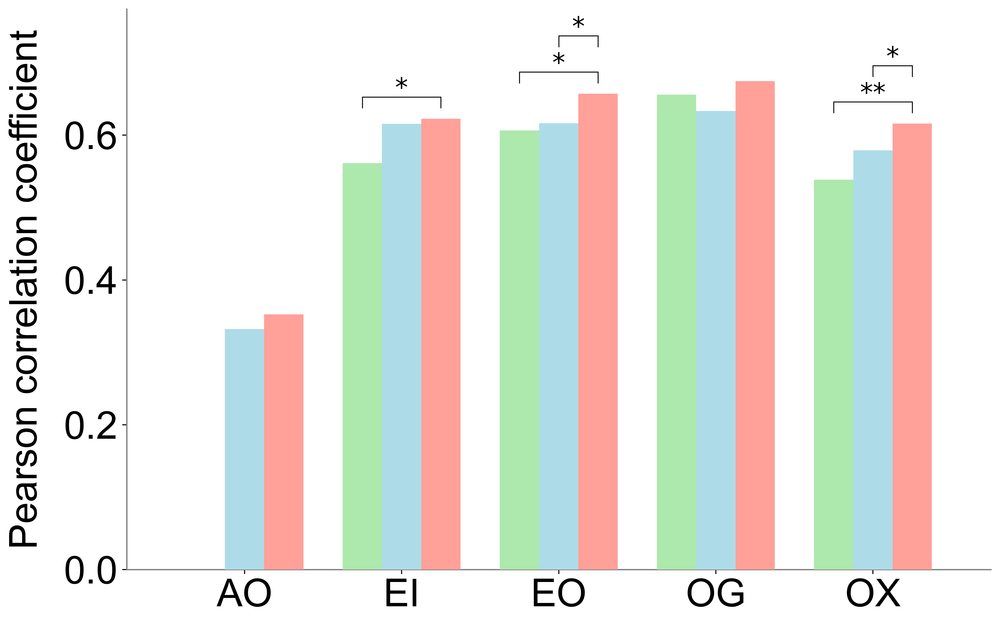

In [71]:
plt.figure(figsize=(12,8),dpi=500)
bar_width = 0.25
num = 5
# plt.bar([i-bar_width for i in range(num)],[abs(i) for i in pcc_lists[0]],
#         bar_width,align="center",color=color_list[10],edgecolor='black',label='All',zorder=100)
#['#93cc82','#99cbeb','#de8787']
#['#ade8ad','#addce8','#ffa099']
#['#ade8ad','#addce8','#ffa099']
plt.bar([i for i in range(num)],s802_pcclist[0],bar_width,align="center",color='#ade8ad',edgecolor='none',label=method_list[0],zorder=100)
plt.bar([i+1*bar_width for i in range(num)],s802_pcclist[1],bar_width,align="center",color='#addce8',edgecolor='none',label=method_list[1],zorder=100)
plt.bar([i+2*bar_width for i in range(num)],s802_pcclist[2],bar_width,align="center",color='#ffa099',edgecolor='none',label=method_list[2],zorder=100)

# plt.legend(loc=1,prop={'weight':'bold','size':15,'family':'Arial'},frameon=False)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

tmp_cate_file = copy.deepcopy(f802_cate)

y_offset = 0.03
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max([i[0] for i in s802_pcclist])
width1 = 0.015
## AO
tmp_file = tmp_cate_file[tmp_cate_file['cate'] == 'AO']
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(tmp_file)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients

for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4, j/4]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)

            x_pos1 = [i/4, i/4]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4, j/4]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20)
## EI
tmp_file = tmp_cate_file[tmp_cate_file['cate'] == 'EI']
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(tmp_file)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max([i[1] for i in s802_pcclist])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4 + 1, j/4 + 1]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            x_pos1 = [i/4 + 1, i/4 +1]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4 +1, j/4+1]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20)         
## EO
tmp_file = tmp_cate_file[tmp_cate_file['cate'] == 'EO']
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(tmp_file)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max([i[2] for i in s802_pcclist])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4+2, j/4+2]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            x_pos1 = [i/4+2, i/4+2]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4+2, j/4+2]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20) 
                
## OG
tmp_file = tmp_cate_file[tmp_cate_file['cate'] == 'OG']
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(tmp_file)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max([i[3] for i in s802_pcclist])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4+3, j/4+3]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            x_pos1 = [i/4+3, i/4+3]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4+3, j/4+3]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20)
## OX
tmp_file = tmp_cate_file[tmp_cate_file['cate'] == 'OX']
model_tmp = method3
pcc_list = []
pcc_dict = {}
dataset = copy.deepcopy(tmp_file)
num_methods = len(model_tmp)
p_values = np.zeros((num_methods, num_methods))
pcc_values = np.zeros((num_methods, num_methods))

for i, method1 in enumerate(model_tmp):
    for j, method2 in enumerate(model_tmp):
        pcc1 = pearsonr(np.array(dataset['dG']), np.array(dataset[method1]))[0]
        pcc2 = pearsonr(np.array(dataset['dG']), np.array(dataset[method2]))[0]
        pcc_both = pearsonr(np.array(dataset[method1]), np.array(dataset[method2]))[0]

        p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset))
        p_values[i, j] = p_value
        pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
count_offset = 0
significance_level = 0.05  # 显著性水平
max_value = max([i[4] for i in s802_pcclist])
for i in range(len(model_tmp)):
    for j in range(i+1, len(model_tmp)):  # 仅对未标注过的模型进行比较
        model1 = model_tmp[i]
        model2 = model_tmp[j]
        p_value = p_values[i, j]
        if p_value < significance_level: 
            x_pos = [i/4+4, j/4+4]
            y_pos = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset]
            plt.plot(x_pos, y_pos, color='black',linestyle='solid',linewidth = linewidth)
            x_pos1 = [i/4+4, i/4+4]
            y_pos1 = [max_value + count_offset + y_offset, max_value  + count_offset + y_offset-width1]
            plt.plot(x_pos1, y_pos1, color='black',linestyle='solid',linewidth = linewidth)
            x_pos2 = [j/4+4, j/4+4]
            y_pos2 = [max_value + count_offset + y_offset , max_value  + count_offset + y_offset- width1]
            plt.plot(x_pos2, y_pos2, color='black',linestyle='solid',linewidth = linewidth)
            count_offset += 0.05
            # 在直线中心位置添加文本标注
            x_center = sum(x_pos) / 2
            y_center = sum(y_pos) / 2
            if p_value < 0.005:
                plt.text(x_center, y_center + 0.001, "**", horizontalalignment='center',fontsize = 20)
            else:
                plt.text(x_center, y_center + 0.001, "*", horizontalalignment='center',fontsize = 20)
                
plt.xlim(-0.5,5.0)
plt.xticks([i+bar_width for i in range(5)],cates,fontsize=30,rotation=0,fontname='Arial')
plt.yticks([i/10 for i in range(0,7,2)],fontsize=30,fontname='Arial')#,weight='bold'
plt.ylabel('Pearson correlation coefficient',fontsize=30,fontname='Arial',labelpad=15)#,weight='bold'
# plt.grid(visible=True,axis='y',color='gray', linestyle='-', linewidth=0.5,zorder=0)
# plt.savefig('/data/jiang/affi/figure/bindppi_0714/s802_cate_bar.jpg',dpi=500,bbox_inches='tight')

In [72]:
def get_max_mcc(label_list,score_list):
    fpr, tpr, threshold = metrics.roc_curve(label_list,score_list)
    mcc_list = []
    for i in threshold:
        label_pred_list = [1 if j>=i else 0 for j in score_list]##注：将较大的值标为1
        mcc = mcc_cal(label_list,label_pred_list)
        mcc_list.append(mcc)
    i = np.arange(len(tpr))
    roc = pd.DataFrame({'tf':pd.Series(tpr-(1-fpr),index=i),'threshold':pd.Series(threshold, index=i),'mcc':pd.Series(mcc_list, index=i)})
    roc['tf_abs'] = abs(roc['tf'])
    roc['mcc_abs'] = abs(roc['mcc'])
    threshold1 = roc.sort_values(by=['mcc'],ascending=0)['threshold'].iloc[0]
    threshold2 = roc.sort_values(by=['mcc_abs'],ascending=0)['threshold'].iloc[0]
    return max(roc['mcc'])

# def bootstrap_samples(data,size,iteration):
#     sample_data_list = []
#     for _ in range(iteration):
#         index_list = np.random.choice(data.shape[0],size,replace=True)
#         sample_data = data.iloc[index_list]
#         sample_data_list.append(sample_data)
#     return sample_data_list

def get_pcc_rmse_auc_mcc(sample_data,i,label_name):
    pcc,pvalue = pearsonr(list(sample_data[i]),list(sample_data['dG']))
    rmse = mean_squared_error(list(sample_data[i]),list(sample_data['dG']))**0.5
    auc_roc = metrics.roc_auc_score(list(sample_data[label_name]),list(sample_data[i]))
    auc_pr = metrics.average_precision_score(list(sample_data[label_name]),list(sample_data[i]))
    mcc = get_max_mcc(list(sample_data[label_name]),list(sample_data[i]))
    return (pvalue,pcc,rmse,auc_roc,auc_pr,mcc)
os.environ['R_HOME'] = '/data/jiang/anaconda3/envs/renv/lib/R'
import rpy2
import rpy2.robjects as robjects
r = robjects.r
r('''library(cocor)''')
r('''library(pROC)''')

def get_hittner2003(aa,bb,cc,nn):##相同数据
    robjects.globalenv['a'] = float(aa)
    robjects.globalenv['b'] = float(bb)
    robjects.globalenv['c'] = float(cc)
    robjects.globalenv['num'] = int(nn)
    result = r('''cocor.dep.groups.overlap(r.jk=a, r.jh=b, r.kh=c, n=num, alternative = "two.sided",test = "hittner2003")''')
    hittner_value = float([line for line in str(result).split('\n') if 'p-value = ' in line][0].strip().split('p-value =')[1].strip())
    return hittner_value

def get_fisher1925(aa,bb,nn1,nn2):##不同数据
    robjects.globalenv['a'] = float(aa)
    robjects.globalenv['b'] = float(bb)
    robjects.globalenv['n1'] = int(nn1)
    robjects.globalenv['n2'] = int(nn2)
    result = r('''cocor.indep.groups(r1.jk=a, r2.hm=b, n1=n1, n2=n2, alternative = "two.sided",test = "fisher1925")''')
    fisher_pvalue = float([line for line in str(result).split('\n') if 'p-value = ' in line][0].strip().split('p-value =')[1].strip())
    return fisher_pvalue

def get_delong(label_list1,score_list1,label_list2,score_list2):###roc曲线
    robjects.globalenv['label_list1'] = robjects.FloatVector(list(label_list1))
    robjects.globalenv['score_list1'] = robjects.FloatVector(list(score_list1))
    robjects.globalenv['label_list2'] = robjects.FloatVector(list(label_list2))
    robjects.globalenv['score_list2'] = robjects.FloatVector(list(score_list2))
    r('''roc1 <- roc(label_list1, score_list1,direction = "<")''')
    r('''roc2 <- roc(label_list2, score_list2,direction = "<")''')
    delong_pvalue = r('p_value = roc.test(roc1,roc2)$p.value')
    return list(delong_pvalue)[0]

R[write to console]: Type 'citation("pROC")' for a citation.

R[write to console]: 
Attaching package: ‘pROC’


R[write to console]: The following objects are masked from ‘package:stats’:

    cov, smooth, var




In [75]:
## for pred,name in zip(['dG_pred','pred_esmppi','pred_seq'],['ExtraTrees','Final','Seq']):
method_name_map = dict(zip(['rf13', 'pred_mean', "average_('Best_seq', 'RF_13')"],
                           [change_name[i] for i in ['rf13', 'pred_mean', "average_('Best_seq', 'RF_13')"]]))
#['#93cc82','#99cbeb','#de8787']
method_color_map = dict(zip(['rf13', 'pred_mean', "average_('Best_seq', 'RF_13')"],
                            ['#93cc82','#99cbeb','#de8787']))
from sklearn.metrics import matthews_corrcoef as mcc_cal
from sklearn.metrics import mean_squared_error
from sklearn import metrics
def plt_roc(data1,label_name,score_list,flag):
    score_list1 = []
    for scores in score_list:
        mcc_sub_list = []
        for score1 in scores:
            data = copy.deepcopy(data1)
            if flag == 0:
                data[score1] = data[score1]*-1
            result_score1 = get_pcc_rmse_auc_mcc(data,score1,label_name)
            mcc_score1 = result_score1[-1]
            mcc_sub_list.append(mcc_score1)
        score_list1.append(scores[mcc_sub_list.index(max(mcc_sub_list))])
    handle_list = []
    for n,i in enumerate(score_list1):
        data = copy.deepcopy(data1)
        if i in data.columns:
            if flag == 0:
                if i in data.columns:
                    data[i] = data[i]*-1
            fpr, tpr, _ = metrics.roc_curve(data[label_name],data[i])
            auc_roc = metrics.roc_auc_score(data[label_name],data[i])
            label_flag = method_name_map[i]
            legend_label = label_flag +' (AUC = '+new_round(auc_roc,2)+')'
            plt.plot(fpr,tpr,color= method_color_map[i],label=legend_label,alpha=1,linewidth=3.5)
            color_patch = mpatches.Patch(color = method_color_map[i], label=legend_label)
            handle_list.append(color_patch)###给每个方法打上颜色legend（这样做可以避免legend重复）
    plt.legend(loc=4,prop={'size':30,'family':'Arial'},frameon=False,handles=handle_list,handlelength=0.8,handleheight=1,handletextpad = 0.5)##frameon=False：legend不需要边框
    plt.ylabel('True positive rate',fontsize=35,fontname='Arial',labelpad=15)#,weight='bold'
    plt.xlabel('False positive rate',fontsize=35,fontname='Arial',labelpad=15)#,weight='bold'
    title_name = 'Permanent' if label=='perm_label' else 'Transient'
    plt.title(title_name,fontsize=35,fontname='Arial',y=1.01)#,weight='bold'

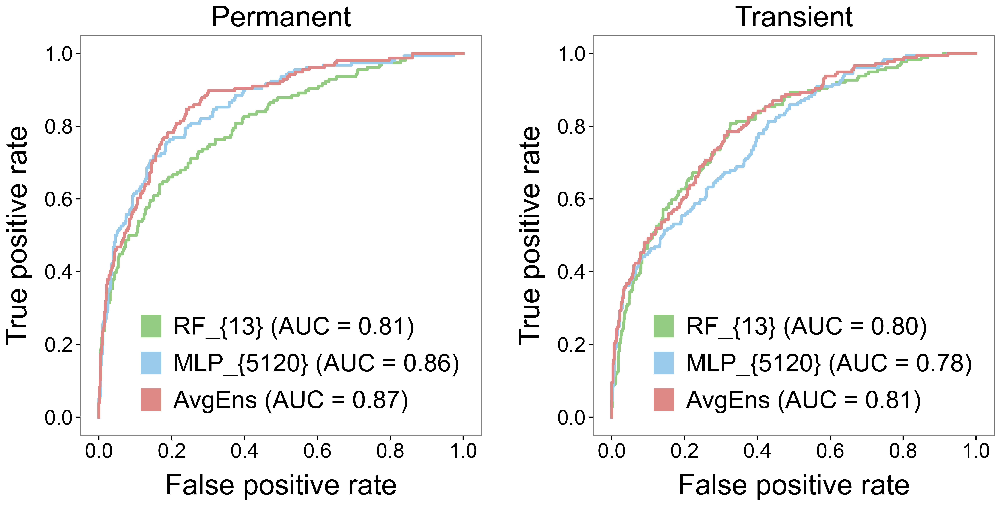

In [76]:
plt.figure(figsize=(20,9),dpi=500)
data_list = [f802,f802]
label_list = ['perm_label','tran_label']
for m,data1,label in zip(range(2),data_list,label_list):
    data1['tran_label'] = np.where(data1['dG']>=-8.18,1,0)
    data1['perm_label'] = np.where(data1['dG']<=-12.27,1,0)
    ax1 = plt.subplot(1,2,m+1)
    flag = 1 if label=='tran_label' else 0
    plt_roc(data1,label,[[i]for i in ['rf13', 'pred_mean', "average_('Best_seq', 'RF_13')"]],flag)
    ax1.tick_params(length=6, width=1.5)
    ax = plt.gca()
#     if m==0:
#         ax.text(-0.15,1.12,ha='left',va= 'top',s='S802',transform=ax.transAxes,
#                 fontsize=30,fontname='Arial',weight='bold')
#     if m==2:
#         ax.text(-0.15,1.12,ha='left',va= 'top',s='b. S192',transform=ax.transAxes,
#                 fontsize=30,fontname='Arial',weight='bold')
    plt.xticks([i/10 for i in range(0,11,2)],fontsize=25,fontname='Arial')#,weight='bold'
    plt.yticks([i/10 for i in range(0,11,2)],fontsize=25,fontname='Arial')#,weight='bold'
plt.subplots_adjust(hspace=0.28, wspace=0.28)

### Figure 6

In [ ]:
## 文件处理（可忽略）

In [56]:
f802 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_withallpred-230703.txt',sep='\t')
f192 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_withallpred-230703.txt',sep='\t')
f108 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_withallpred-230703.txt',sep='\t')
f365 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_withallpred-230703.txt',sep='\t')

f802['mlp5120'] = f802['pred_mean']
f192['mlp5120'] = f192['pred_mean']
f108['mlp5120'] = f108['pred_mean']
f365['mlp5120'] = f365['pred_mean']

s1562_pfrm_methods = pd.read_csv('/data/jiang/affi/other_methods/s1562_pfrm_methods',sep='\t')
s1562_ccharppi = pd.read_csv('/data/jiang/affi/other_methods/ccharppi/s1562_ccharppi',sep='\t')

s81_raw_pfrm_methods = pd.read_csv('/data/jiang/affi/other_methods/s81_raw_pfrm_methods',sep='\t')
s81_raw_ccharppi = pd.read_csv('/data/jiang/affi/other_methods/ccharppi/s81_raw_ccharppi',sep='\t')
s1562_pfrm_methods.shape,s1562_ccharppi.shape,s81_raw_pfrm_methods.shape,s81_raw_ccharppi.shape

## PPI-Affinity

s1562_ppi_affinity = pd.read_csv('/data/jiang/affi/other_methods/ppi_affinity/s1562_ppi_affinity',sep='\t')
s81_raw_ppi_affinity = pd.read_csv('/data/jiang/affi/other_methods/ppi_affinity/s81_raw_ppi_affinity',sep='\t')
s1562_ppi_affinity.shape,s81_raw_ppi_affinity.shape

## ISLAND

s1562_island = pd.read_csv('/data/jiang/affi/other_methods/island/s1562_island',sep='\t')
s81_raw_island = pd.read_csv('/data/jiang/affi/other_methods/island/s81_raw_island',sep='\t')
s1562_island = pd.concat([s1562_island,pd.DataFrame({'Complex':['5e95','1e50','1e96'],'ISLAND':[-10.073,-9.459,-8.874]})],axis = 0,ignore_index=1)
s1562_island.shape,s81_raw_island.shape

## PPA_Pred2

s1562_ppa_pred2 = pd.read_csv('/data/jiang/affi/other_methods/ppa_pred2/s1562_ppa_pred2_resubmit.txt',sep='\t')
s81_raw_ppa_pred2 = pd.read_csv('/data/jiang/affi/other_methods/ppa_pred2/s81_raw_ppa_pred2',sep='\t')
s1562_ppa_pred2.shape,s81_raw_ppa_pred2.shape

## Minpredictor

s1562_minpredictor = pd.read_csv('/data/jiang/affi/other_methods/minpredictor/s1562_minpredictor',sep='\t')
s81_raw_minpredictor = pd.read_csv('/data/jiang/affi/other_methods/minpredictor/s81_raw_minpredictor',sep='\t')
s1562_minpredictor.shape,s81_raw_minpredictor.shape

f802_2 = f802.merge(s1562_pfrm_methods,on = ['Complex','pdb_chain'],how = 'left').merge(s1562_ccharppi,on = ['Complex'],how = 'left').merge(s1562_ppi_affinity,how = 'left').merge(s1562_island,how = 'left').merge(s1562_ppa_pred2,how = 'left').merge(s1562_minpredictor,how = 'left')
f192_2 = f192.merge(s1562_pfrm_methods,on = ['Complex','pdb_chain'],how = 'left').merge(s1562_ccharppi,on = ['Complex'],how = 'left').merge(s1562_ppi_affinity,how = 'left').merge(s1562_island,how = 'left').merge(s1562_ppa_pred2,how = 'left').merge(s1562_minpredictor,how = 'left')
f108_2 = f108.merge(s1562_pfrm_methods,on = ['Complex','pdb_chain'],how = 'left').merge(s1562_ccharppi,on = ['Complex'],how = 'left').merge(s1562_ppi_affinity,how = 'left').merge(s1562_island,how = 'left').merge(s1562_ppa_pred2,how = 'left').merge(s1562_minpredictor,how = 'left')
f365_2 = f365.merge(s1562_pfrm_methods,on = ['Complex','pdb_chain'],how = 'left').merge(s1562_ccharppi,on = ['Complex'],how = 'left').merge(s1562_ppi_affinity,how = 'left').merge(s1562_island,how = 'left').merge(s1562_ppa_pred2,how = 'left').merge(s1562_minpredictor,how = 'left')

In [57]:
## 绘图部分

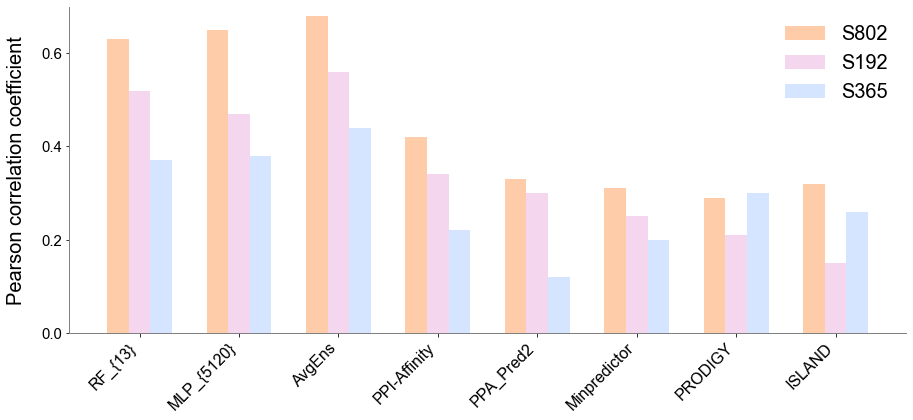

In [58]:
method9_color_dict = {
    'rf13':'#93cc82',
    'mlp174':'#93cc82',
    'rf5120':'#99cbeb',
    'pred_mean':'#99cbeb',
    'rf5120_13':'#c2abd9',
    'rf5120_174':'#c2abd9',
    'mlp5120+13':'#c2abd9',
    '2_32_3_512':'#c2abd9',
    r"average_('Best_seq', 'RF_13')":'#de8787',
}
# for data,name in zip(['cv_pcc','f192_pcc','f108_pcc','f365_pcc','f665_pcc'],['S802','S192','S108','S365','S665']):
pcc_list_all = []
for data,name,datase in zip(['cv_pcc','f192_pcc','f365_pcc'],['S802','S192','S365'],[f802_2,f192_2,f365_2]):
    model_tmp = method8
    pcc_list = []
    pcc_dict = {}
    for method in model_tmp:
        
        datase1 = datase[datase[method].notna()]
#         pcc_values = all_method_df[all_method_df['model'] == method][data].values
        pcc_values = new_round(pearsonr(datase1['dG'],datase1[method])[0],2)
        pcc_list.append(float(pcc_values))
        pcc_dict[method] = float(pcc_values)
    pcc_list_all.append(pcc_list)       
#     dataset = copy.deepcopy(datase)
#     num_methods = len(model_tmp)
#     p_values = np.zeros((num_methods, num_methods))
#     pcc_values = np.zeros((num_methods, num_methods))

#     for i, method1 in enumerate(model_tmp):
#         for j, method2 in enumerate(model_tmp):
#             dataset1 = dataset[dataset[method1].notna()]
#             dataset2 = dataset1[dataset1[method2].notna()]
#             pcc1 = pearsonr(np.array(dataset2['dG']), np.array(dataset2[method1]))[0]
#             pcc2 = pearsonr(np.array(dataset2['dG']), np.array(dataset2[method2]))[0]
#             pcc_both = pearsonr(np.array(dataset2[method1]), np.array(dataset2[method2]))[0]

#             p_value = get_hittner2003(pcc1, pcc2, pcc_both, len(dataset2))
#             p_values[i, j] = p_value
#             pcc_values[i, j] = pcc1 - pcc2  # Difference in Pearson correlation coefficients
# 设置图形的大小
plt.figure(figsize=(15, 6))

# 生成x轴刻度和柱状图位置
x = np.arange(len(model_tmp))
bar_width = 0.25

seq_trad = ['rf5120', 'xgb5120']
seq_deep = ['mlp5120', 'pred_mean', 'resnet5120', 'mult5120']
str_trad = ['rf13', 'rf174', 'rf1428', 'xgb13']
str_deep = ['mlp13', 'mlp174', 'mlp1428']
ensemble = [
    r"average_('Best_seq', 'RF_13')",
    r"Waverage_('Best_seq', 'RF_13')",
    r"lr_('Best_seq', 'RF_13')",
    "rf_stack"
]
fused_deep = [
    'mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256', '2_32_3_512'
]
fused_trad = ['rf5120_13', 'rf5120_174', 'rf5120_1428']

seq_methods = seq_trad + seq_deep
str_methods = str_trad + str_deep
ensemble_methods = ensemble
fused_methods = fused_trad + fused_deep
colors = ['#f9ac61','#67c2a5','#f16a4d','#6ea8ee','#93c6e5']
#         colors = ['darkgreen','darkorange','red','blue']
color_list = []
for i in model_tmp:
    if i in seq_methods:
        color_list.append(colors[0])
    if i in str_methods:
        color_list.append(colors[1])
    if i in ensemble_methods:
        color_list.append(colors[2])
    if i in fused_methods:
        color_list.append(colors[3])
    if i not in seq_methods + str_methods + ensemble_methods+fused_methods:
        color_list.append(colors[4])

# ['#ffccaa','#f4d7ee','#d5e5ff']
# ['#addeaf','#abcde9','#f9bcbf'']
colors = ['#ffccaa','#f4d7ee','#d5e5ff']
# 绘制柱状图
xishu = 1.15
plt.bar([i*xishu for i in range(8)]  , pcc_list_all[0], width=bar_width, label=name,color = '#ffccaa')
plt.bar([i*xishu + bar_width for i in range(8)] , pcc_list_all[1], width=bar_width, label=name,color = '#f4d7ee')
plt.bar([i*xishu + 2*bar_width for i in range(8)], pcc_list_all[2], width=bar_width, label=name,color = '#d5e5ff')

# 添加图例
custom_labels = ['S802', 'S192','S365']
font = FontProperties(family='Arial', size=20)
plt.legend(custom_labels,prop=font,frameon = False)
# plt.legend(fontname='Arial',fontsize=12,frameon = False)





# 添加刻度标签
plt.xticks(x*xishu+ bar_width, [change_name[i] for i in model_tmp],fontsize=16, rotation=45,fontname='Arial',ha='right')#weight='bold'
#     plt.xlabel('Method')
plt.yticks([i/10 for i in range(0,11,2)],fontsize=15,fontname='Arial')#,weight='bold'
plt.ylabel('Pearson correlation coefficient',fontsize=20,fontname='Arial',labelpad=15)
ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
if name in ['S802']:
    plt.ylim([0,1])
if name in ['S192']:
    plt.ylim([0,0.9])
if name in ['S108']:
    plt.ylim([0,0.7])
if name in ['S365']:
    plt.ylim([0,0.7])
if name in ['S600']:
    plt.ylim([0,0.8])

# plt.savefig(f'/data/jiang/affi/BindPPI/result1118/tmp1204/Figure6_3.png',dpi=500,bbox_inches='tight')
# 展示图形
plt.show()

### Table S2

In [46]:
change_name = {
    'mlp5120': 'MLP_{5120}',
    'pred_mean': 'MLP_{5120}',
    'resnet5120': 'SC_{5120}',
    'mult5120': 'MHA_{5120}',
    'rf5120': 'RF_{5120}',
    'xgb5120': 'XGBoost_{5120}',
    'rf293': 'RF_{293}',
    'xgb293': 'XGBoost_{293}',
    'rf13': 'RF_{13}',
    'rf174': 'RF_{174}',
    'rf1428': 'RF_{1428}',
    'xgb13': 'XGBoost_{13}',
    'mlp13': 'MLP_{13}',
    'mlp174': 'MLP_{174}',
    'mlp1428': 'MLP_{1428}',
#     r"average_('Best_seq', 'RF_13')": 'A_MLP_{5120},RF_{13}',
#     r"Waverage_('Best_seq', 'RF_13')": 'W_MLP_{5120},RF_{13}',
#     'rf_stack': 'RF_MLP_{5120},RF_{13}',
#     r"lr_('Best_seq', 'RF_13')": 'LR_MLP_{5120},RF_{13}',
#     r"average_('Best_seq', 'RF_13')": 'Averaging Ensemble',
#     r"Waverage_('Best_seq', 'RF_13')": 'Weighted Ensemble',
#     'rf_stack': 'Random Forest',
#     r"lr_('Best_seq', 'RF_13')": 'Linear regression',
    r"average_('Best_seq', 'RF_13')": 'AvgEns',
    r"Waverage_('Best_seq', 'RF_13')": 'WtdAvgEns',
    'rf_stack': 'RFEns',
    r"lr_('Best_seq', 'RF_13')": 'LREns',
    'mlp5120+13': 'MLP_{5120, 13}',
    'mlp5120+174': 'MLP_{5120, 174}',
    'mlp5120+1428': 'MLP_{5120, 1428}',
    '1_16_4_256': 'MLP_{5120////256, 13/208}',
    '2_16_4_256': 'MLP_{5120////256, 13//208}',
    '1_32_3_512': 'MLP_{5120///512, 13/416}',
    '2_32_3_512': 'MLP_{5120///512, 13//416}',
    'rf5120_13': 'RF_{5120, 13}',
    'rf5120_174': 'RF_{5120, 174}',
    'rf5120_1428': 'RF_{5120, 1428}',
    'PPI-Affinity':'PPI-Affinity',
    'PPA_Pred2':'PPA_Pred2',
    'Minpredictor':'Minpredictor',
    'prodigy':'PRODIGY',
    'ISLAND':'ISLAND',
    'dG':'$∆G_{exp}$'
}

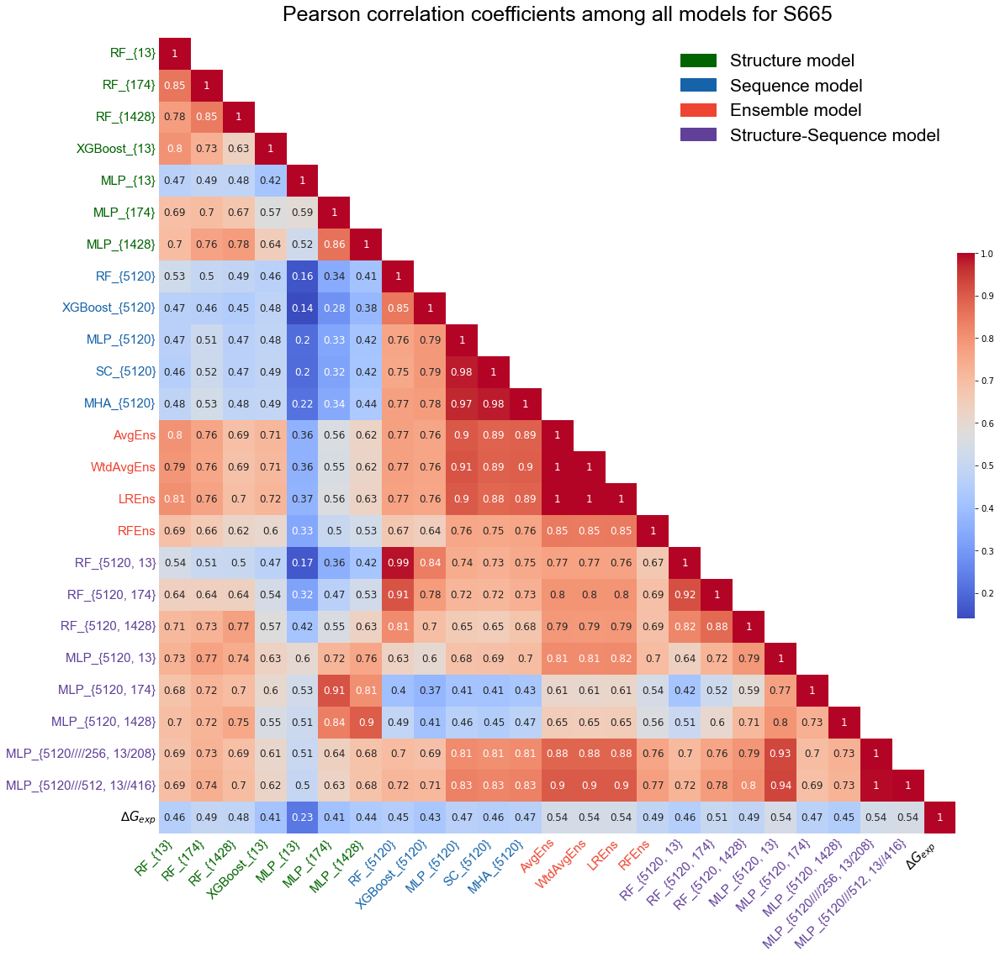

In [47]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
import copy

# 创建一个测试数据框
# use_method = ['pred_mean', 'resnet5120', 'mult5120', 'rf5120', 'xgb5120']+ ['rf13','rf1428', 'xgb13', 'mlp13','mlp1428'] + \
#              [r"average_('Best_seq', 'RF_13')", r"Waverage_('Best_seq', 'RF_13')", 'rf_stack',
#               r"lr_('Best_seq', 'RF_13')", 'mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256','2_32_3_512', \
#               'rf5120_13', 'rf5120_174', 'rf5120_1428']
all_method = ['rf13','rf174','rf1428', 'xgb13','mlp13','mlp174','mlp1428'] + ['rf5120', 'xgb5120','pred_mean', 'resnet5120', 'mult5120']+\
            [r"average_('Best_seq', 'RF_13')", r"Waverage_('Best_seq', 'RF_13')",r"lr_('Best_seq', 'RF_13')", 'rf_stack'] +\
            ['rf5120_13','rf5120_174', 'rf5120_1428'] + ['mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256','2_32_3_512']

seq_trad = ['rf5120', 'xgb5120']
seq_deep = ['mlp5120', 'pred_mean', 'resnet5120', 'mult5120']
str_trad = ['rf13', 'rf174', 'rf1428', 'xgb13']
str_deep = ['mlp13', 'mlp174', 'mlp1428']
ensemble = [
    r"average_('Best_seq', 'RF_13')",
    r"Waverage_('Best_seq', 'RF_13')",
    r"lr_('Best_seq', 'RF_13')",
    "rf_stack"
]
fused_deep = [
    'mlp5120+13', 'mlp5120+174', 'mlp5120+1428', '1_16_4_256', '2_32_3_512'
]
fused_trad = ['rf5120_13', 'rf5120_174', 'rf5120_1428']

seq_methods = seq_trad + seq_deep
str_methods = str_trad + str_deep
ensemble_methods = ensemble
fused_methods = fused_trad + fused_deep

## 是否需要dG这一列
all_method = all_method + ['dG']

for data, dataname in zip([f665], ['S665']):
    dataset = copy.deepcopy(data)
    data = data[all_method]

    # 计算相关系数矩阵
    corr_matrix = data.corr()
    corr_matrix = corr_matrix.loc[all_method, all_method]
    corr_matrix.columns = [change_name.get(i, i) for i in corr_matrix.columns]
    corr_matrix.index = list([change_name.get(i, i) for i in corr_matrix.index])

    corr_matrix_flip = corr_matrix.iloc[::-1]

    # 绘制热图
    fig, ax = plt.subplots(figsize=(20, 20))

    # Get the number of methods
    num_methods = len(all_method)

    # Create a mask for the upper triangle
#     mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    # 创建上三角形的掩码
#     mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    mask = np.tri(corr_matrix.shape[0], k=-1).T
    
    # Create a color palette for different categories
#     colors = ['#f9ac61','#67c2a5','#f16a4d','#6ea8ee']
    colors = ['darkgreen','#1663A9','#EE4431','#614099']
    color_list = []
    for i in all_method:
        if i in str_methods:
            color_list.append(colors[0])
        if i in seq_methods:
            color_list.append(colors[1])
        if i in ensemble_methods:
            color_list.append(colors[2])
        if i in fused_methods:
            color_list.append(colors[3])
        if i in ['dG']:
            color_list.append('black')

    heatmap = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask = mask, xticklabels=True, yticklabels=True,
                          annot_kws={'size': 12}, cbar_kws={'shrink': 0.4,'pad':0.001}, linewidths=0, linecolor='lightgray',
                          square=True, cbar=True)

    # Set tick parameters for better visualization
    plt.tick_params(axis='both', length=0)

    # Set title and labels
    plt.title(f'Pearson correlation coefficients among all models for {dataname}',fontname = 'Arial',fontsize = 25, pad=20)
#     plt.xlabel('Methods', color=colors[0])
#     plt.ylabel('Methods', color=colors[1])

    labels = [ 'Structure model','Sequence model', 'Ensemble model', 'Structure-Sequence model']
    patches = [plt.Rectangle((0, 0), 1, 1, color=color) for color in colors]
    # 显示图例，并设置边框大小
    legend = ax.legend(patches, labels, loc='upper right', framealpha=1, frameon=True, edgecolor='white', prop={'size': 21, 'family': 'Arial'})



    # 设置x轴标签颜色
    for tick_label, color in zip(heatmap.get_xticklabels(), color_list):
        tick_label.set_color(color)
        tick_label.set_fontsize(15)
        tick_label.set_fontname('Arial')
        tick_label.set_rotation(45)  # 将x轴标签旋转45度
        tick_label.set_ha('right')   # 将x轴标签设置为右对齐
#         tick_label.set_fontweight('bold')
    for tick_label, color in zip(heatmap.get_yticklabels(), color_list):
        tick_label.set_color(color)
        tick_label.set_fontsize(15)
        tick_label.set_fontname('Arial')
#         tick_label.set_fontweight('bold')
    plt.show()


### Figure S3

In [ ]:
## 文件处理（可忽略）

In [77]:
f192_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_rf13_7000.txt',sep='\t')
f108_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_rf13_7000.txt',sep='\t')
f365_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_rf13_7000.txt',sep='\t')
f802_7000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_rf13_7000.txt',sep='\t')
f192_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f192_rf13_2000.txt',sep='\t')
f108_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f108_rf13_2000.txt',sep='\t')
f365_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f365_rf13_2000.txt',sep='\t')
f802_2000 = pd.read_csv('/data/jiang/affi/analysis_zff/new_seq_mlp/f802_rf13_2000.txt',sep='\t')
f802_methods2 = f802.merge(f802_7000,how='left').merge(f802_2000,how='left')
f192_methods2 = f192.merge(f192_7000,how='left').merge(f192_2000,how='left')
f108_methods2 = f108.merge(f108_7000,how='left').merge(f108_2000,how='left')
f365_methods2 = f365.merge(f365_7000,how='left').merge(f365_2000,how='left')

In [ ]:
## 绘图部分

In [78]:
def plot_scatter_subplot(dG_pred_list,dG_list,m,n,o,me1,color = 'black'):
    plt.rcParams['axes.linewidth'] = 1
    plt.rcParams['axes.edgecolor'] = 'grey'
    # 自定义虚线样式
#     line_style = '--'  # 虚线样式
    dash_length = 7  # 虚线长度
    gap_length = 7    # 间隔长度
    dash_interval = dash_length + gap_length  # 虚线间隔
    plt.scatter(dG_pred_list,dG_list,color='black',label=r'$RF_{13}$',alpha=1,linewidths=0.7,s=65,edgecolors='white')
    slope1, intercept1, r1, p1, se1 = linregress(dG_pred_list, dG_list)
    ax1.axline((-10, -10 * slope1+intercept1), slope=slope1,color='black',ls='--',dashes=[dash_length, gap_length])
    ax = plt.gca()
#     if n in [1]:
#         ax.text(-0.2,1.13,ha='left',va= 'top',s=ascii_lowercase[m-1]+'.',transform=ax.transAxes,
#                 fontsize=25,fontname='Arial',weight='bold')
    corr,pvalue = pearsonr(dG_pred_list,dG_list)
    pcc_content = ''
    if new_round(corr,2)=='-0.00':
        corr = 0.00
    if pvalue<0.01:
        pcc_content = new_round(corr,2)#+'**'
    if (pvalue>=0.01)&(pvalue<0.05):
        pcc_content = new_round(corr,2)#+'*'
    if pvalue>=0.05:
        pcc_content = new_round(corr,2)
    if pvalue>0.005:
        print(m,n)
    ax.text(0.03,0.95,ha='left',va= 'top',s='PCC = '+pcc_content,
            transform=ax.transAxes,fontsize=18,fontname='Arial')#,weight='bold'
    ax.text(0.03,0.88,ha='left',va= 'top',s='RMSE = '+"%.2f"%
            (mean_squared_error(dG_pred_list,dG_list)**0.5),
            transform=ax.transAxes,fontsize=18,fontname='Arial')#,weight='bold'
    if n in [1]:
        plt.ylabel('$∆G\mathregular{_{exp}}$ (kcal mol$\mathregular{^{-1}}$)',fontsize=20,fontname='Arial')
    plt.yticks(range(-20,1,5))
    if m in [3]:
        plt.xlabel('$∆G\mathregular{_{RF\_\{13\}}}$ (kcal mol$\mathregular{^{-1}}$)',fontsize=20,fontname='Arial')
    if o in [1]:
        plt.xticks(range(-18,-5,4))
    if o in [2]:
        plt.xticks(range(-18,-7,2))
    if o in [3]:
        plt.xticks(range(-14,-7,2))
    if o in [4]:
        plt.xticks(range(-14,-7,2))

In [79]:
name_list = ['S802','S192','S108','S365']
dataset_list = [f802_methods2,f192_methods2,f108_methods2,f365_methods2]
me_list = ['rf13','rf13_2000','rf13_7000']
plt.figure(figsize=(20,16),dpi=500)
o = 0
xaxis_ax1_list,yaxis_ax1_list = [],[]
for m,me in zip(range(1,len(me_list)+1),me_list):
    for n,data,name in zip(range(1,len(dataset_list)+1),dataset_list,name_list):
        o = o+1
        dG_pred_list,dG_list = list(data[me]),list(data['dG'])
        if (m in [1])&(n in [1]):
            ax1 = plt.subplot(3,4,o)
        elif (m in [1])&(n not in [1]):
            ax1 = plt.subplot(3,4,o,sharey=yaxis_ax1_list[m-1])
        elif (m not in [1])&(n in [1]):
            ax1 = plt.subplot(3,4,o,sharex=xaxis_ax1_list[n-1])
        else:
            ax1 = plt.subplot(3,4,o,sharex=xaxis_ax1_list[n-1],sharey=yaxis_ax1_list[m-1])
        plot_scatter_subplot(dG_pred_list,dG_list,m,n,o,me,color_list[m-1])
        ax1.tick_params(length=5, width=1.2)
        if o in [1,2,3,4]:
            plt.title(name,fontsize=25,fontname='Arial',y=1.02)###标题
        if m in [1,2]:
            ax1.set_xticklabels(ax1.get_xticks(),color='w',fontsize=12,fontname='Arial')#,weight='bold'
        if m not in [2]:
            ax1.set_xticklabels(ax1.get_xticks(),fontsize=12,fontname='Arial')#,weight='bold'
        if n not in [1]:
            ax1.set_yticklabels(ax1.get_yticks(),color='w',fontsize=12,fontname='Arial')#,weight='bold'
        if n in [1]:
            ax1.set_yticklabels(ax1.get_yticks(),fontsize=12,fontname='Arial')#,weight='bold'
        if m in [1]:
            xaxis_ax1_list.append(ax1)
        if n in [1]:
            yaxis_ax1_list.append(ax1)
    plt.subplots_adjust(hspace=0.1, wspace=0.1)

### Figure S4

In [ ]:
## 文件处理（可忽略）

In [82]:
df = pd.read_csv('/data/jiang/affi/BindPPI/result1118/case_pdb_rmsd.txt',sep='\t')

df2 = pd.read_csv('/data/jiang/affi/BindPPI/result1118/f192_rmsd.txt',sep='\t')


f192['100_dif'] = f192['dG'] - f192['rf13']
f192['2000_dif'] = f192['dG'] - f192['rf13_2000']
f192['7000_dif'] = f192['dG'] - f192['rf13_7000']
f192['2000-7000_dif'] = f192['rf13_2000'] - f192['rf13_7000']
f192['100-2000_dif'] = f192['rf13'] - f192['rf13_2000']
f192['100-7000_dif'] = f192['rf13'] - f192['rf13_7000']

In [ ]:
## 绘图部分

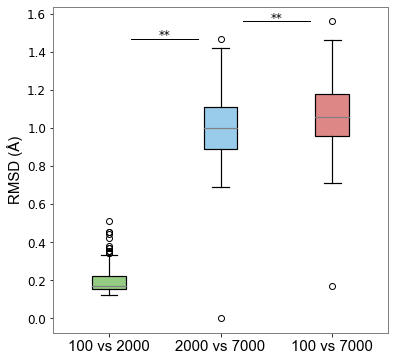

In [83]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from scipy.stats import ttest_ind
# 假设您有 tmp DataFrame 包含 'p1'、'p2' 和 'rmsd' 列
tmp = df2.sort_values(by = 'pdbid')
tmp['p1'] = tmp['p1'].astype(str)
tmp['p2'] = tmp['p2'].astype(str)
# 提取每个区间的 'pred' 值作为列表
group1 = tmp[(tmp['p1'] == '100') & (tmp['p2'] == '2000')]['rmsd']
group2 = tmp[(tmp['p1'] == '2000') & (tmp['p2'] == '7000')]['rmsd']
group3 = tmp[(tmp['p1'] == '100') & (tmp['p2'] == '7000')]['rmsd']


data_for_boxplot = [group1.astype(float), group2.astype(float), group3.astype(float)]

# 设置自定义颜色列表
colors = ['#93cc82', '#99cbeb', '#de8787']

# 使用 Matplotlib 的 boxplot 方法绘制箱线图
plt.figure(figsize=(6, 6))

# 使用 patch_artist 参数设置箱体颜色
bp = plt.boxplot(data_for_boxplot, patch_artist=True)#, patch_artist=True
# plt.boxplot(data_for_boxplot, labels=interval_labels)
# 设置箱体颜色
for i, box in enumerate(bp['boxes']):
    box.set(facecolor=colors[i])
    
for i in range(len(data_for_boxplot) - 1):
    p_val = ttest_ind(data_for_boxplot[i], data_for_boxplot[i + 1]).pvalue
    if p_val < 0.01:
        plt.text(i + 1.45, max(max(data_for_boxplot[i]), max(data_for_boxplot[i + 1]))+ 0, '**', fontsize=12)  # 标注 p-value < 0.05 的组
        plt.plot([i + 1.2, i + 1.8], [max(max(data_for_boxplot[i]), max(data_for_boxplot[i + 1])) ] * 2, linewidth=1, color='black')  # 在箱线图之间添加标注线
    elif p_val < 0.05:
        plt.text(i + 1.35, max(max(data_for_boxplot[i]), max(data_for_boxplot[i + 1]))+ 0.1, '*', fontsize=12)  # 标注 p-value < 0.05 的组
        plt.plot([i + 1, i + 1.7], [max(max(data_for_boxplot[i]), max(data_for_boxplot[i + 1]))  ] * 2, linewidth=1, color='black')  # 在箱线图之间添加标注线
    
    
# 设置 x 轴刻度标签
# plt.xticks([1, 2, 3], ['100 v.s.2000', '100 v.s.7000', '2000 v.s.7000'])

# # 设置 y 轴标签
# plt.ylabel('RMSD (Å)')

# 设置 x 轴刻度标签
plt.xticks([1, 2, 3], ['100 vs 2000',  '2000 vs 7000','100 vs 7000'], fontproperties=fm.FontProperties(family='Arial', size=15))

# 设置 y 轴标签
plt.ylabel('RMSD (Å)', fontproperties=fm.FontProperties(family='Arial', size=15))
plt.yticks(fontsize=12)

# 修改箱线图的线条颜色
for median in bp['medians']:
    median.set(color='grey', linewidth=1.1)  # 设置中位数线的颜色和线宽
# 修改所有线条的线宽
for key in bp.keys():
    plt.setp(bp[key], linewidth=1.2)  # 设置线条宽度为2
plt.show()

Figure S5 - Figure S7,Figure S9都是出现过的类型，不再赘述

### Figure S8

In [85]:
df = pd.read_csv('/data/jiang/affi/BindPPI/result1118/table1_bootstrap_2.txt',sep='\t')

In [86]:
def process_value(value):
    # 提取括号内的内容并按逗号分隔
    extracted_values = value.split('(')[1].split(')')[0].split(',')
    
    dif = new_round(float(extracted_values[2]) - float(extracted_values[1]),2)
    # 重新排列括号内的值
    reordered_values = extracted_values[0] + ' ' + extracted_values[2] + ' ' + extracted_values[1] +' '+ dif
    return reordered_values

columns = list(df.columns)[1:]
# 对DataFrame中的每个单元格应用处理函数，并将结果拆分成三列
for col in columns:
    new_cols = df[col].apply(process_value).str.split(' ', expand=True)
    df[[col+'_mean', col+'_up', col+'_down', col+'_dif']] = new_cols


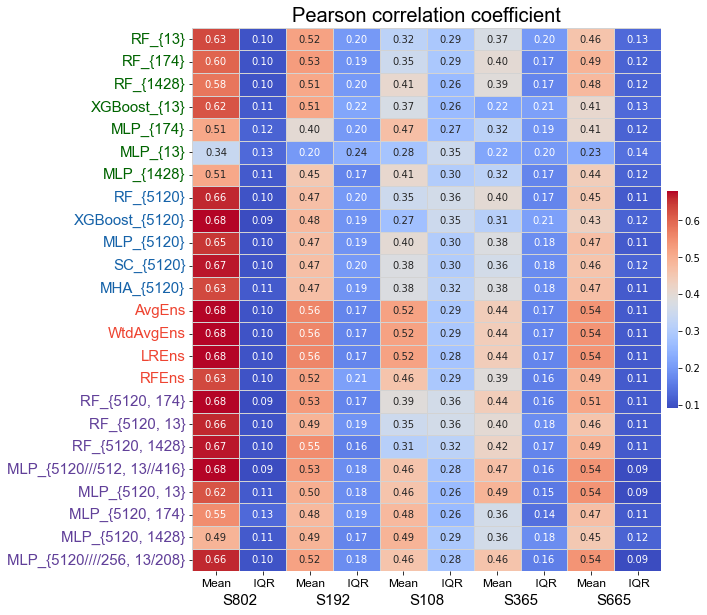

In [87]:
use_col = ['cv_pcc_mean','cv_pcc_dif','f192_pcc_mean','f192_pcc_dif','f108_pcc_mean','f108_pcc_dif','f365_pcc_mean','f365_pcc_dif','f665_pcc_mean','f665_pcc_dif']
file_use = copy.deepcopy(df[use_col])
file_use[use_col] = file_use[use_col].astype(float)
xlables = ['S802 mean','S802 dif','S192 mean','S192 dif','S108 mean','S108 dif','S365 mean','S365 dif','S665 mean','S665 dif']
xlables = ['Mean',' IQR','Mean',' IQR','Mean',' IQR','Mean',' IQR','Mean',' IQR']
color_list = ['darkgreen',
 'darkgreen',
 'darkgreen',
 'darkgreen',
 'darkgreen',
 'darkgreen',
 'darkgreen',
 '#1663A9',
 '#1663A9',
 '#1663A9',
 '#1663A9',
 '#1663A9',
 '#EE4431',
 '#EE4431',
 '#EE4431',
 '#EE4431',
 '#614099',
 '#614099',
 '#614099',
 '#614099',
 '#614099',
 '#614099',
 '#614099',
 '#614099']
plt.figure(figsize=(10, 10))

heatmap =sns.heatmap(
    file_use,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    xticklabels=xlables,
    yticklabels=[change_name[i] for i in df['model']],
    annot_kws={'size': 10},
    cbar_kws={'shrink': 0.4, 'pad': 0.01},
    linewidths= 0.5,
    linecolor='lightgray',
#     square=True
)
plt.xticks(fontsize=12, rotation=0, ha='center',fontname='Arial')
plt.yticks(fontsize=15, rotation=0, ha='right',fontname='Arial')
for tick_label, color in zip(heatmap.get_yticklabels(), color_list):
    tick_label.set_color(color)
plt.text(1, 25.3, 'S802', fontsize=15, color='black', ha='center', va='center',fontname='Arial')
plt.text(3, 25.3, 'S192', fontsize=15, color='black', ha='center', va='center',fontname='Arial')
plt.text(5, 25.3, 'S108', fontsize=15, color='black', ha='center', va='center',fontname='Arial')
plt.text(7, 25.3, 'S365', fontsize=15, color='black', ha='center', va='center',fontname='Arial')
plt.text(9, 25.3, 'S665', fontsize=15, color='black', ha='center', va='center',fontname='Arial')
plt.title('Pearson correlation coefficient',fontname='Arial',fontsize = 20)
plt.show()

## PremPS综述

### Figure2

In [28]:
## 文件处理（可忽略）

In [34]:
color_dict_scar = {}
for k in methods:
    if k in methods_ml_str:
        color_dict_scar[k] = '#93cc82'
    if k in methods_ml_seq:
        color_dict_scar[k] = '#99cbeb'
    if k in methods_noml_str:
        color_dict_scar[k] = '#de8787' # #de8787
    if k in methods_noml_seq:
        color_dict_scar[k] = '#c2abd9'

color_dict_scar2 = {}
for k in methods:
    if k in methods_ml_str:
        color_dict_scar2[k] = 'darkgreen'
    if k in methods_ml_seq:
        color_dict_scar2[k] = '#1663A9'
    if k in methods_noml_str:
        color_dict_scar2[k] = '#9e343b'# 9e343b
    if k in methods_noml_seq:
        color_dict_scar2[k] = '#614099'

f4038 = pd.read_csv('~/affi/premps/s4038_draw.txt',sep='\t')
f4038_sta = f4038[f4038['ddG']<0]
f4038_desta = f4038[f4038['ddG']>=0]

methods_ml_str = ['RASP-elife','ThermoMPNN','MAESTRO','INPS3D','ACDC-NN','PremPS','DDMut','PoPMuSiC','SimBa-IB','SimBa-SYM','ThermoNet','Dynamut2',\
 'AUTO-MUTE-RF 2.0','I-Mutant 2.0','BayeStab','AUTO-MUTE-SVM 2.0']
methods_ml_seq = ['INPS','ACDC-NN-Seq', 'SAAFEC-SEQ','MUpro', 'I-Mutant-Seq 2.0']
methods_noml_str = ['DDGun3D', 'Rosetta','MultiMutate','CUPSAT','FoldX']
methods_noml_seq = ['DDGun']
methods = methods_ml_str + methods_ml_seq + methods_noml_str + methods_noml_seq
method_train = {
    'INPS':'S2648',
    'MUpro':'S1615',
    'Dynamut2':'S4022',
    'I-Mutant 2.0':'S1948',
    'I-Mutant-Seq 2.0':'S2048',
    'PoPMuSiC':'S2648',
    'ACDC-NN':'S2648',
    'SAAFEC-SEQ':'S2648',
    'MAESTRO':'SP4',
    'ThermoNet':'S1744',
    'PremPS':'S5296',
    'ACDC-NN-Seq':'ACDC',
    'BayeStab':'S2648',
    'FoldX':'None',
    'AUTO-MUTE-RF 2.0':'S1925',
    'AUTO-MUTE-SVM 2.0':'S1925',
    'INPS3D':'S2648', 
    'DDMut':'S9028',
#     'GEODDG':'Sgeo',
    'SimBa-IB':'B1112',
    'SimBa-SYM':'B1112',  
    'ThermoMPNN':'ThermoMPNN',
    'RASP-elife':'RASP',
#     'GEODDG':'Sgeo',
    'DDGun3D':'None',
    'MultiMutate':'None',
    'Rosetta':'None',
    'FoldX':'None',
#     'PSP-GNM':'None',
    'DDGun':'None',
    'CUPSAT':'None'
}
change_name = {
    'INPS':'INPS',
    'MUpro':'MUpro',
    'Dynamut2':'DynaMut2',
    'I-Mutant 2.0':'I-Mutant2.0',
    'I-Mutant-Seq 2.0':'I-Mutant2.0-Seq',
    'PoPMuSiC':'PoPMuSiC 2.1',
    'ACDC-NN':'ACDC-NN',
    'SAAFEC-SEQ':'SAAFEC-SEQ',
    'MAESTRO':'MAESTRO',
    'ThermoNet':'ThermoNet',
    'PremPS':'PremPS',
    'ACDC-NN-Seq':'ACDC-NN-Seq',
    'BayeStab':'BayeStab',
    'FoldX':'FoldX',
    'AUTO-MUTE-RF 2.0':'AUTO-MUTE(RF)',
    'AUTO-MUTE-SVM 2.0':'AUTO-MUTE(SVM)',
    'INPS3D':'INPS3D', 
    'DDMut':'DDMut',
#     'GEODDG':'Sgeo',
    'SimBa-IB':'SimBa-IB',
    'SimBa-SYM':'SimBa-SYM',  
    'ThermoMPNN':'ThermoMPNN',
    'RASP-elife':'RaSP',
    'GEODDG':'GeoDDG',
    'DDGun3D':'DDGun3D',
    'MultiMutate':'MultiMutate',
    'Rosetta':'Rosetta',
    'FoldX':'FoldX',
    'PSP-GNM':'PSP-GNM',
    'DDGun':'DDGun',
    'CUPSAT':'CUPSAT'
}
method_train = {key: method_train[key] for key in methods}

method_rev = []
for method1 in methods:
    data = copy.deepcopy(f4038)
    data = data[data[method1].notna()]
    data = data[~pd.to_numeric(data[method1], errors='coerce').isnull()]
    data[method1] = data[method1].astype(float)
    data_sta = data[data['ddG'] < 0]
    data_unsta = data[data['ddG'] >= 0]
    all_pcc,_ = pearsonr(np.array(data['ddG']),np.array(data[method1]))
    if all_pcc < 0 :
        method_rev.append(method1)


## 要按照R排序；
r_dict_1 = {}
r_dict_2 = {}
r_dict_3 = {}
r_dict_4 = {}
file_use = copy.deepcopy(f4038)
type_use = 'all'
for key, value in method_train.items():
    file,file1,file2,file_overlap = 0,0,0,0
    if (key in methods_ml_str ):
        m8_file = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/S4038_{type_use}-{value}_{type_use}.m8',sep='\t',header = None)
        train_set = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/{value}.txt',sep='\t')
        file = remove_overlap(file_use,train_set)[0]
        file_overlap = remove_overlap(file_use,train_set)[1]
        fileseq = {}
        for i in list(set(file['pdb_chain'])):
            x = m8_file[m8_file[0] == i]
            if len(x) != 0:
                score = x[2].max()
                fileseq[i] = score
            else: 
                score = 0  
                fileseq[i] = score
        file['seq_align_maxscore'] = file['pdb_chain'].apply(lambda x : fileseq[x])
        
        data = copy.deepcopy(file)
        data = data[data[key].notna()]
        file = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file[key] = file[key].astype(float)
    
        if key in method_rev:
            file[key] = -file[key].astype(float)
        if key == 'Rosetta':
            file[key] = file[key]/2.9
        x = file[key]
        y = file['ddG']
        r = new_round(pearsonr(x,y)[0],2)
        r_dict_1[key] = r
        pvalue = pearsonr(x,y)[1]
        if pvalue > 0.005:
            print(key)
    if (key in methods_ml_seq ):
        m8_file = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/S4038_{type_use}-{value}_{type_use}.m8',sep='\t',header = None)
        train_set = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/{value}.txt',sep='\t')
        file = remove_overlap(file_use,train_set)[0]
        file_overlap = remove_overlap(file_use,train_set)[1]
        fileseq = {}
        for i in list(set(file['pdb_chain'])):
            x = m8_file[m8_file[0] == i]
            if len(x) != 0:
                score = x[2].max()
                fileseq[i] = score
            else:
                score = 0  
                fileseq[i] = score
        file['seq_align_maxscore'] = file['pdb_chain'].apply(lambda x : fileseq[x])
        
        data = copy.deepcopy(file)
        data = data[data[key].notna()]
        file = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file[key] = file[key].astype(float)
    
        if key in method_rev:
            file[key] = -file[key].astype(float)
        if key == 'Rosetta':
            file[key] = file[key]/2.9
        x = file[key]
        y = file['ddG']
        r = new_round(pearsonr(x,y)[0],2)
        r_dict_2[key] = r
        pvalue = pearsonr(x,y)[1]
        if pvalue > 0.005:
            print(key)
    if (key in methods_noml_str ):
        data = copy.deepcopy(file_use)
        data = data[data[key].notna()]
        file1 = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file1[key] = file1[key].astype(float)
        if key in method_rev:
            file1[key] = -file1[key].astype(float)
        if key == 'Rosetta':
            file1[key] = file1[key]/2.9
        x = file1[key]
        y = file1['ddG']
        r = new_round(pearsonr(x,y)[0],2)
        r_dict_3[key] = r
        pvalue = pearsonr(x,y)[1]
        if pvalue > 0.005:
            print(key)
    if (key in methods_noml_seq ):
        data = copy.deepcopy(file_use)
        data = data[data[key].notna()]
        file1 = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file1[key] = file1[key].astype(float)
        if key in method_rev:
            file1[key] = -file1[key].astype(float)
        if key == 'Rosetta':
            file1[key] = file1[key]/2.9
        x = file1[key]
        y = file1['ddG']
        r = new_round(pearsonr(x,y)[0],2)
        r_dict_4[key] = r
        pvalue = pearsonr(x,y)[1]
        if pvalue > 0.005:
            print(key)
# 按值进行排序
# sorted_data1 = {k: v for k, v in sorted(r_dict_1.items(), key=lambda item: float(item[1]), reverse=True)}
sorted_data1 = ['PremPS','ThermoMPNN','MAESTRO','RASP-elife','PoPMuSiC','ACDC-NN','INPS3D','DDMut','SimBa-IB',\
                'Dynamut2', 'I-Mutant 2.0', 'SimBa-SYM', 'AUTO-MUTE-RF 2.0', 'ThermoNet', 'BayeStab', 'AUTO-MUTE-SVM 2.0']
sorted_data2 = {k: v for k, v in sorted(r_dict_2.items(), key=lambda item: float(item[1]), reverse=True)}

sorted_data3 = {k: v for k, v in sorted(r_dict_3.items(), key=lambda item: float(item[1]), reverse=True)}

sorted_data4 = {k: v for k, v in sorted(r_dict_4.items(), key=lambda item: float(item[1]), reverse=True)}

sort_list = [k for k in sorted_data1] + [k for k in sorted_data2] + [k for k in sorted_data3]+ [k for k in sorted_data4]
# 输出排序后的字典
print(sort_list)
sort_method_train = {}
for key in sort_list:
    sort_method_train[key] = method_train[key]


['PremPS', 'ThermoMPNN', 'MAESTRO', 'RASP-elife', 'PoPMuSiC', 'ACDC-NN', 'INPS3D', 'DDMut', 'SimBa-IB', 'Dynamut2', 'I-Mutant 2.0', 'SimBa-SYM', 'AUTO-MUTE-RF 2.0', 'ThermoNet', 'BayeStab', 'AUTO-MUTE-SVM 2.0', 'SAAFEC-SEQ', 'ACDC-NN-Seq', 'INPS', 'MUpro', 'I-Mutant-Seq 2.0', 'DDGun3D', 'MultiMutate', 'Rosetta', 'FoldX', 'CUPSAT', 'DDGun']


In [ ]:
## 绘图部分

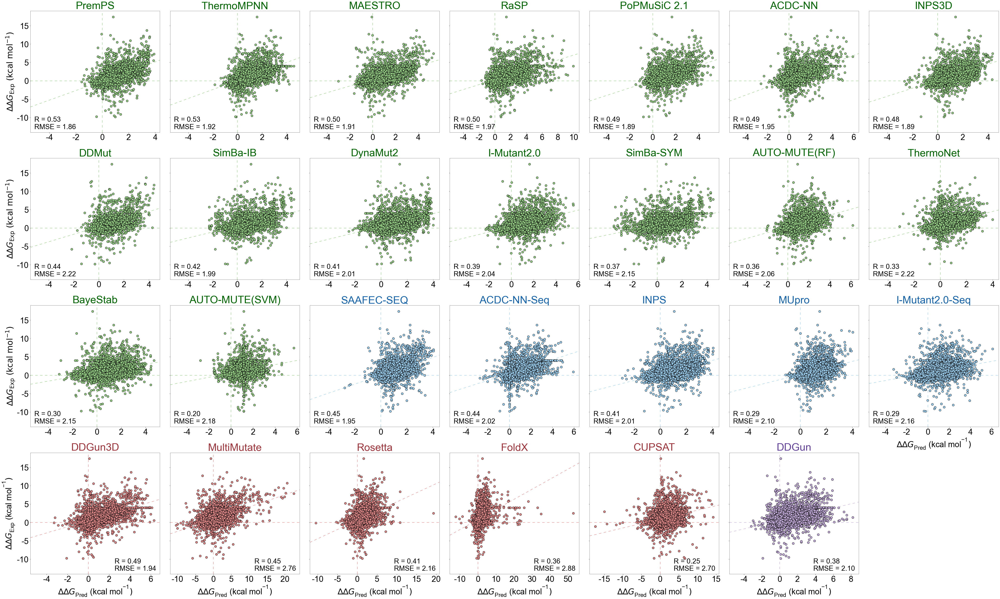

In [35]:
import matplotlib.pyplot as plt
import math
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['axes.edgecolor'] = 'grey'
dash_length = 7  # 虚线长度
gap_length = 7    # 间隔长度
dash_interval = dash_length + gap_length  # 虚线间隔
color_list = ['#93cc82','#99cbeb','#c2abd9','#de8787']

type_use = 'all'
file_use = copy.deepcopy(f4038)
# 计算子图布局的行数和列数
# num_methods = len(methods_ml_str)
num_rows = 4
num_cols = 7
title_size = 45
ddg_size = 35
r_rmse_size = 30
x_y_trick_size = 35

y_range = range(-15, 19, 5)
y_bottom, y_top = -14, 19



# 创建包含多个子图的图形
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(60, 36))

# 使用 axes[行索引][列索引] 来访问每个子图
for j, ((key, value), ax) in enumerate(zip(sort_method_train.items(), axes.ravel())):
    # 设置 x 轴刻度标签为整数格式
# for j, (key, value), ax in zip(range(30),method_train.items(), axes.ravel()):
    file,file1,file2,file_overlap = 0,0,0,0
    if (key in methods_ml_str + methods_ml_seq):
        m8_file = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/S4038_{type_use}-{value}_{type_use}.m8',sep='\t',header = None)
        train_set = pd.read_csv(f'/data/jiang/affi/premps/new_alignment/{value}.txt',sep='\t')
        file = remove_overlap(file_use,train_set)[0]
        file_overlap = remove_overlap(file_use,train_set)[1]
        fileseq = {}
        for i in list(set(file['pdb_chain'])):
            x = m8_file[m8_file[0] == i]
            if len(x) != 0:
                score = x[2].max()
                fileseq[i] = score
            else:
                score = 0  
                fileseq[i] = score
        file['seq_align_maxscore'] = file['pdb_chain'].apply(lambda x : fileseq[x])
        
        data = copy.deepcopy(file)
        data = data[data[key].notna()]
        file = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file[key] = file[key].astype(float)
        
        if key in method_rev:
            file[key] = -file[key].astype(float)
        if key == 'Rosetta':
            file[key] = file[key]/2.9
            
        if j in [0,7,14,21,28]:
            x = file[key]
            y = file['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')
            
            
            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
    
    #         ax = plt.gca()
            ax.text(0.03,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.03,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='black',fontname='Arial',fontsize=x_y_trick_size)  
            ax.set_ylim(y_bottom, y_top)
            
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key], fontsize=title_size, fontname='Arial')
#             ax.set_xlabel('$∆∆G\mathregular{_{pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')
            ax.set_ylabel('$∆∆G\mathregular{_{Exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size)
            if j in [21]:
                ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')

        elif j in [20,21,22,23,24]:
            x = file[key]
            y = file['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')
            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
    #         ax = plt.gca()
            ax.text(0.03,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.03,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='w',fontname='Arial',fontsize=0)   
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
            ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')
#             ax.set_ylabel('$∆∆G\mathregular{_{exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')

        else:
            x = file[key]
            y = file['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')
            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
    #         ax = plt.gca()
            ax.text(0.03,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.03,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='w',fontname='Arial',fontsize=0)   
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
#             ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')
#             ax.set_ylabel('$∆∆G\mathregular{_{exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')

        
    elif (key in methods_noml_str + methods_noml_seq):
        data = copy.deepcopy(file_use)
        data = data[data[key].notna()]
        file1 = data[~pd.to_numeric(data[key], errors='coerce').isnull()]
        file1[key] = file1[key].astype(float)
        if key in method_rev:
            file1[key] = -file1[key].astype(float)
        if key == 'Rosetta':
            file1[key] = file1[key]/2.9

    #             # 创建散点图
        if j in [0,7,14,28]:
            x = file1[key]
            y = file1['ddG']
        #         x2 = file2[key]
        #         y2 = file2['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')
            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])

        #         ax = plt.gca()
            ax.text(0.65,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.65,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='black',fontname='Arial',fontsize=x_y_trick_size)   
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
#             ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')
            ax.set_ylabel('$∆∆G\mathregular{_{Exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')

        elif j in [20,22,23,24,25,26]:
            x = file1[key]
            y = file1['ddG']
        #         x2 = file2[key]
        #         y2 = file2['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')

            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
        #         ax = plt.gca()
            ax.text(0.65,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.65,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='w',fontname='Arial',fontsize= 0)   
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
            ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')
#             ax.set_ylabel('$∆∆G\mathregular{_{exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=25, fontname='Arial')
        elif j in [21]:
            x = file1[key]
            y = file1['ddG']
        #         x2 = file2[key]
        #         y2 = file2['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')

            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
        #         ax = plt.gca()
            ax.text(0.65,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.65,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='black',fontname='Arial',fontsize=x_y_trick_size)      
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
            ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')
            ax.set_ylabel('$∆∆G\mathregular{_{Exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=ddg_size, fontname='Arial')
    
        else:
            x = file1[key]
            y = file1['ddG']
            ax.scatter(x, y, color=color_dict_scar[key], alpha=1,linewidths=1,s=85,edgecolors='black')
            slope1, intercept1, r1, p1, se1 = linregress(x, y)
            ax.axline((-5, -5 * slope1+intercept1), slope=slope1,color = color_dict_scar[key],ls='--',dashes=[dash_length, gap_length])
    #         ax = plt.gca()
            ax.text(0.65,0.13,ha='left',va= 'top',s='R = '+str(new_round(pearsonr(x,y)[0],2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.text(0.65,0.07,ha='left',va= 'top',s='RMSE = '+str(new_round(mean_squared_error(x,y)**0.5,2)),
                    transform=ax.transAxes,fontsize=r_rmse_size,fontname='Arial')
            ax.set_xticklabels([int(xtick) for xtick in ax.get_xticks()],color='black',fontname='Arial',fontsize=x_y_trick_size)
            ax.set_yticklabels(y_range,color='w',fontname='Arial',fontsize=0)   
            ax.set_ylim(y_bottom, y_top)
            # 设置子图属性
            ax.axhline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])
            ax.axvline(0, color=color_dict_scar[key], ls='--',dashes=[dash_length, gap_length])

            ax.set_title(change_name[key], color=color_dict_scar2[key] , fontsize=title_size, fontname='Arial')
#             ax.set_xlabel('$∆∆G\mathregular{_{Pred}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')
#             ax.set_ylabel('$∆∆G\mathregular{_{exp}}$ (kcal mol$\mathregular{^{-1}})$', fontsize=16, fontname='Arial')
        
        
# # 移除多余的子图
for i in range(j+1,j+2):
    fig.delaxes(axes.flatten()[i])

# # 调整子图布局
plt.subplots_adjust(hspace=0.1, wspace=0.1)
plt.tight_layout()

# # 保存整个图形
# plt.savefig('/data/jiang/affi/premps/result1030/s4038_scar.png', dpi=500)


### Figure3

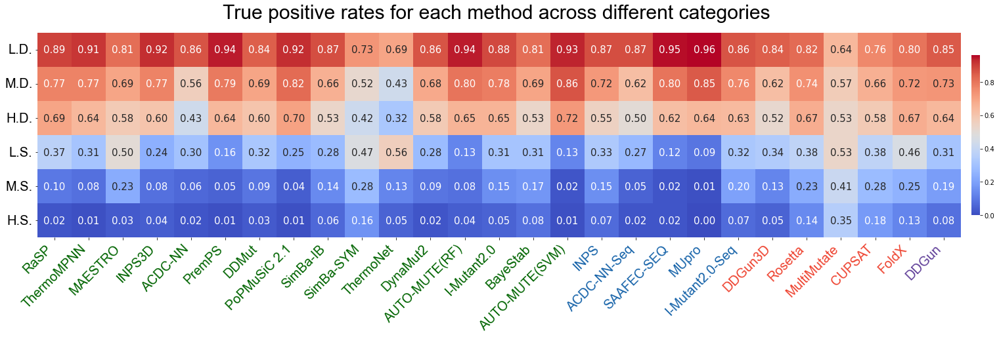

In [40]:
results_df = pd.read_csv('/data/jiang/affi/premps/result1030/f4038_mlstr_Figure1.txt',sep='\t')
results_df[:5]

result1 = results_df[['Method'] + [i for i in results_df.columns if '0-100' in i]]
result2 = results_df[['Method'] + [i for i in results_df.columns if '0-25' in i]]
result3 = results_df[['Method'] + [i for i in results_df.columns if '25-100' in i]]

result1 = result1.T
result1.columns = result1.iloc[0]
result1 = result1[1:]

result2 = result2.T
result2.columns = result2.iloc[0]
result2 = result2[1:]

result3 = result3.T
result3.columns = result3.iloc[0]
result3 = result3[1:]

# 设置Method列为索引

import seaborn as sns
import matplotlib.pyplot as plt
for dat,name in zip([result1],['0_100']):
    data_matrix = dat.values
    data_matrix = data_matrix.astype(float)
    # 创建热图
    plt.figure(figsize=(30, 15))
    # 直接将y轴标签设置为空列表
    plt.yticks([])
    heatmap = sns.heatmap(data_matrix, annot=True, fmt=".2f", cmap='coolwarm',  xticklabels=[change_name[i] for i in list(dat.columns)], yticklabels=[i.split('_')[0] for i in list(dat.index)],
                          annot_kws={'size': 15},  linewidths=0, linecolor='lightgray',
                          square=True, cbar=False)

    plt.xticks(fontsize=20, rotation=0, ha='center',fontname='Arial')
    plt.yticks(fontsize=20, rotation=0, ha='right',fontname='Arial')
    if name in ['0_25']:
        pass
#         plt.title('True positive rates for each method across different categories for S4038$^{[0-25\%]}$', color='black', fontsize=25, fontname='Arial', y=1.05)
    elif name in ['25_100']:
        pass
#         plt.title('True positive rates for each method across different categories for S4038$^{[25-100\%]}$', color='black', fontsize=25, fontname='Arial', y=1.05)
    else:
        plt.title('True positive rates for each method across different categories ', color='black', fontsize=30,fontname='Arial', y=1.05)

    cbar_mappable = heatmap.get_children()[0]
    cbar = plt.colorbar(cbar_mappable, shrink=0.3, pad=0.01)
    cbar.outline.set_visible(False)

    # 设置x轴标签颜色
    colors = ['darkgreen','#1663A9','#EE4431','#614099']
    color_list = []
    for i in list(result1.columns):
        if i in methods_ml_str:
            color_list.append(colors[0])
        if i in methods_ml_seq:
            color_list.append(colors[1])
        if i in methods_noml_str:
            color_list.append(colors[2])
        if i in methods_noml_seq:
            color_list.append(colors[3])
    for tick_label, color in zip(heatmap.get_xticklabels(), color_list):
        tick_label.set_color(color)
        tick_label.set_fontsize(20)
        tick_label.set_fontname('Arial')
        tick_label.set_rotation(45)  # 将x轴标签旋转45度
        tick_label.set_ha('right')   # 将x轴标签设置为右对齐

    plt.show()

### Figure4

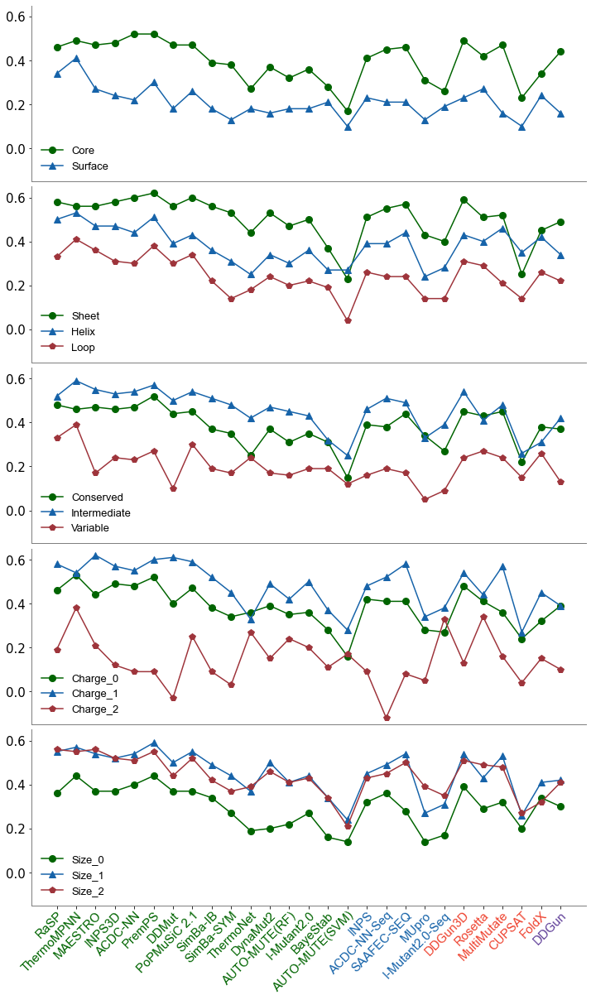

In [42]:
import matplotlib.pyplot as plt
import os
import pandas as pd
three_color = ['darkgreen','#1663A9','#9e343b']

markersize = 8

file = '/data/jiang/affi/premps/result1030/f4038_0_100_cate.txt'
filename = file.split('/')[-1].split('.')[0]
# type_use = ['_R','_sta_R','_desta_R','_sta_TP/P','_desta_TP/P']
for type_use in ['_R']:
    b= pd.read_csv(file,header=0,sep='\t')
    method_len = len(b)
    # 创建一个有3个坐标系的画板
    fig, axs = plt.subplots(5, 1, figsize=(12, 20))
    x = np.linspace(1, 15, 15)
    #######################################################################################################
    #Core,Surface
    b=pd.read_csv(file,header=0,sep='\t')
    b['Core']=b[f'Core{type_use}']
    b['Surface']=b[f'Surface{type_use}']
    b0 = list(b['Core'])
    b1 = list(b['Surface'])
    # 设置不同的颜色和形状
    # line_styles = ['ro-', 'b--']
    # 创建一个有3个坐标系的画板
    x = np.linspace(1, method_len, method_len)
    axs[0].plot(x,b0, label='Core', marker='o',color=three_color[0],markersize=markersize)
    axs[0].plot(x,b1, label='Surface', color=three_color[1],marker='^',markersize=markersize)

    #########################################################################################################
    #Secondary Structure
    a=pd.read_csv(file,header=0,sep='\t')
    a['Sheet']=a[f'SHEET{type_use}']
    a['Helix']=a[f'HELIX{type_use}']
    a['Loop']=a[f'LOOP{type_use}']
    a0 = np.array(list(a['Sheet']))
    a1 = np.array(list(a['Helix']))
    a2 = np.array(list(a['Loop']))
    # 设置不同的颜色和形状
    # line_styles = ['ro-', 'b--', 'g-.']

    axs[1].plot(x,a0, label='Sheet', marker='o',color=three_color[0],markersize=markersize)
    axs[1].plot(x,a1, label='Helix', color=three_color[1],marker='^',markersize=markersize)
    axs[1].plot(x,a2, label='Loop', color=three_color[2],marker='p',markersize=markersize)

    ###################################################################################################
    #conservation
    c=pd.read_csv(file,header=0,sep='\t')
    c['Conserved']=c[f'Conserved{type_use}']
    c['Intermediate']=c[f'Intermediate{type_use}']
    c['Variable']=c[f'Variable{type_use}']
    c0 = list(c['Conserved'])
    c1 = list(c['Intermediate'])
    c2 = list(c['Variable'])
    # line_styles = ['ro-', 'b--', 'g-.']
    x = np.linspace(1, method_len, method_len)
    axs[2].plot(x,c0, label='Conserved', marker='o',color=three_color[0],markersize=markersize)
    axs[2].plot(x,c1, label='Intermediate', color=three_color[1],marker='^',markersize=markersize)
    axs[2].plot(x,c2, label='Variable', color=three_color[2],marker='p',markersize=markersize)

    ######################################################################################################
    #charge_change
    d=pd.read_csv(file,header=0,sep='\t')
    d['Charge_0']=d[f'Charge_0{type_use}']
    d['Charge_1']=d[f'Charge_1{type_use}']
    d['Charge_2']=d[f'Charge_2{type_use}']
    d0 = list(d['Charge_0'])
    d1 = list(d['Charge_1'])
    d2 = list(d['Charge_2'])
    # line_styles = ['ro-', 'b--', 'g-.']
    x = np.linspace(1, method_len, method_len)
    axs[3].plot(x,d0, label='Charge_0', marker='o',color=three_color[0],markersize=markersize)
    axs[3].plot(x,d1, label='Charge_1', color=three_color[1],marker='^',markersize=markersize)
    axs[3].plot(x,d2, label='Charge_2', color=three_color[2],marker='p',markersize=markersize)

    ################################################################################################
    #size change
    e=pd.read_csv(file,header=0,sep='\t')
    e['Size_0']=e[f'Size_0{type_use}']
    e['Size_1']=e[f'Size_1{type_use}']
    e['Size_2']=e[f'Size_2{type_use}']
    e0 = list(e['Size_0'])
    e1 = list(e['Size_1'])
    e2 = list(e['Size_2'])
    # line_styles = ['ro-', 'b--', 'g-.']
    x = np.linspace(1, method_len, method_len)
    axs[4].plot(x,e0, label='Size_0', marker='o',color=three_color[0],markersize=markersize)
    axs[4].plot(x,e1, label='Size_1', color=three_color[1],marker='^',markersize=markersize)
    axs[4].plot(x,e2, label='Size_2', color=three_color[2],marker='p',markersize=markersize)


    x_labels =list(a['model'])
        
    # 设置x轴标签颜色
    colors = ['darkgreen','#1663A9','#EE4431','#614099']
    color_list = []
    for i in x_labels:
        if i in methods_ml_str:
            color_list.append(colors[0])
        if i in methods_ml_seq:
            color_list.append(colors[1])
        if i in methods_noml_str:
            color_list.append(colors[2])
        if i in methods_noml_seq:
            color_list.append(colors[3])
        
        
    # 在每个坐标系中绘制折线图
#     axs[4].set_xticks([i+1 for i in range(method_len)], x_labels,color =color_list,rotation=45,ha='right',fontsize=12)
#     for ax in axs[:-1]:
#         ax.set_xticks([])
#         ax.set_xlabel('')
    # Loop through each subplot and set x-axis labels and colors
#     for i, ax in enumerate(axs):
#         if i == 4:
#             ax.set_xticks([i + 1 for i in range(len(x_labels))])
#             ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12, color=color_list)
#             ax.set_xlabel('X-axis Label', fontsize=12)  # Replace 'X-axis Label' with your desired label
#         else:
#             ax.set_xticks([])
#             ax.set_xlabel('')
# ax = plt.gca()
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)

    for i, ax in enumerate(axs):
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        
    # Loop through each subplot and set x-axis labels and colors
    for i, ax in enumerate(axs):
        if i == 4:
            ax.set_xticks([i+1 for i in range(len(x_labels))])
            ax.set_xticklabels([change_name[i] for i in x_labels], rotation=45, ha='right', va='top',rotation_mode='anchor', fontsize=15,fontname='Arial')
            ax.tick_params(axis='x', pad=1)  # 这里的 pad 值可以根据需要进行调整
            
#             ax.set_xlabel('X-axis Label', fontsize=12)  # Replace 'X-axis Label' with your desired label

            # Set color for each x-axis label
            for label, color in zip(ax.get_xticklabels(), color_list):
                label.set_color(color)
        else:
            ax.set_xticks([])
            ax.set_xlabel('')
            
    for i, ax in enumerate(axs):
        ax.tick_params(axis='y', labelsize=15)
            
    legend_size = 13
    # 定义字体属性
    from matplotlib.font_manager import FontProperties
    legend_font = FontProperties(family='Arial', size=legend_size)

# 在图例中使用字体属性
    axs[0].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
    axs[1].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
    axs[2].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
    axs[3].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
    axs[4].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)

#     axs[0].text(-0.1, 0.97, 'a', transform=axs[0].transAxes, fontsize=25, fontweight='bold')
#     axs[1].text(-0.1, 0.97, 'b', transform=axs[1].transAxes, fontsize=25, fontweight='bold')
#     axs[2].text(-0.1, 0.97, 'c', transform=axs[2].transAxes, fontsize=25, fontweight='bold')
#     axs[3].text(-0.1, 0.97, 'd', transform=axs[3].transAxes, fontsize=25, fontweight='bold')
#     axs[4].text(-0.1, 0.97, 'e', transform=axs[4].transAxes, fontsize=25, fontweight='bold')

    plt.subplots_adjust(hspace=0.03, wspace=0.1)
    for ax in axs:
        ax.set_ylim(-0.15,0.65)
#     axs[3].set_ylim(-0.72,0.7)

    # 调整布局和间距
    # plt.tight_layout(rect=[0, 0, 0.95, 1], h_pad=0.02)




### Figure S2

In [90]:
s1130 = pd.read_csv('~/affi/premps/S1130.txt',sep='\t')
ddgname = 'ddG'

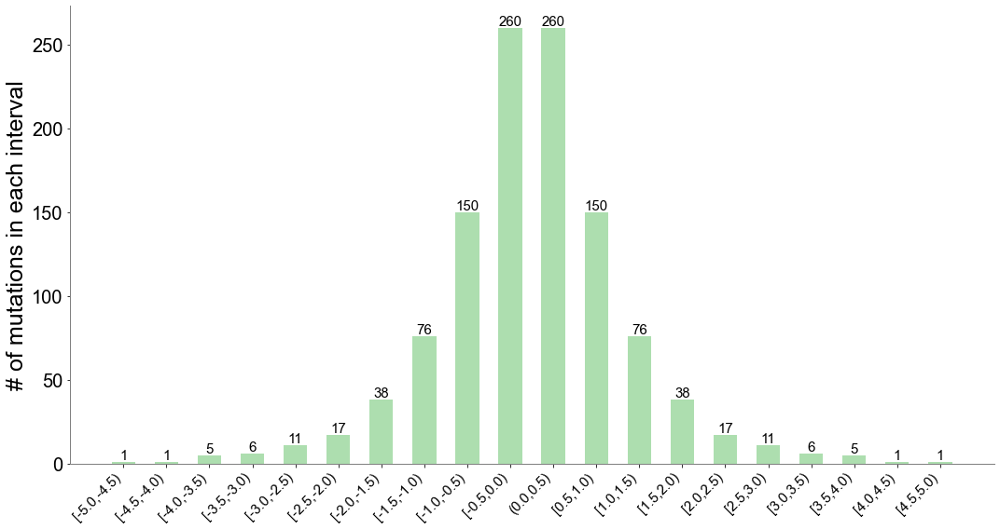

In [91]:
data = copy.deepcopy(s1130)
cut1 = 0.5
ddg_bin1 = abs(int(data[ddgname].max()/cut1) + 1)
ddg_bin2 = abs(int(data[ddgname].min()/cut1) - 1)
data_subset1 = pd.DataFrame()
data_subset2 = pd.DataFrame()
result = {}
for i in reversed(range(ddg_bin2)):
    x1 = data[(data[ddgname] > -cut1 * (i+1)) & (data[ddgname] <= -cut1* i)]
    if cut1* i == 0:
        result['['+str(-cut1 * (i+1))+','+str(0.0)+')'] = len(x1)
#         result[str(-cut1 * (i+1))+','+str(0.0)] = len(x1)
    else:
        result['['+str(-cut1 * (i+1))+','+str(-cut1* i)+')'] = len(x1)
#         result[str(-cut1 * (i+1))+','+str(-cut1* i)] = len(x1)
    
for i in range(ddg_bin1):
    x1 = data[(data[ddgname] > cut1 * i) & (data[ddgname] <= cut1* (i+1))]
    if cut1* i == 0:
        result['('+str(cut1 * i)+','+str(cut1* (i+1))+')'] = len(x1)
#         result[str(cut1 * i)+','+str(cut1* (i+1))] = len(x1)
    else:
        result['['+str(cut1 * i)+','+str(cut1* (i+1))+')'] = len(x1)
#         result[str(cut1 * i)+','+str(cut1* (i+1))] = len(x1)
x = pd.DataFrame({'key':result.keys(),'value':result.values()},index = result.keys())
#     x.plot(kind='bar', legend=False)
x=x[:-1]
# 设置图形的大小
plt.figure(figsize=(15, 8))  # 设置图形大小

ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


p1 = plt.bar(x['key'], x['value'], width= 0.55,label='value',color = '#addeaf')  # width表示柱子的宽度
plt.bar_label(p1, label_type='edge',fontsize=15,fontname='Arial') 

plt.xticks(fontsize=15,rotation=45,fontname='Arial', ha='right')
plt.yticks([i for i in range(0,300,50)],fontsize=20,fontname='Arial')#,weight='bold'
# plt.xlabel('# of intervals', fontsize=25,fontname='Arial')  # 设置x轴标签
plt.ylabel('# of mutations in each interval', fontsize=25,fontname='Arial')  # 设置y轴标签
plt.tight_layout()
# plt.xticks(rotation=90) 

## 毕业论文

### Figure 3.3

In [93]:
f4038_scan = pd.read_csv('/data/jiang/affi/premps_deep/f4038scan.txt',sep='\t')
f2648_scan = pd.read_csv('/data/jiang/affi/premps_deep/f2648scan.txt',sep='\t')

s4038 = f4038_scan[f4038_scan['data_label'] == True]
s2648 = f2648_scan[f2648_scan['data_label'] == True]

In [94]:
s4038_pdbchain  = list(set(s4038['PDBid'] +'_'+ s4038['mutation'].str[1]))
len(s4038_pdbchain)
s2648_pdbchain  = list(set(s2648['PDBid'] +'_'+ s2648['mutation'].str[1]))
len(s2648_pdbchain)

132

In [95]:
import json
with open('/data/jiang/affi/premps_deep/s2648_4038_single.json','r') as fw:
    s4038_s2648_seq = json.load(fw)

s4038_seq = {}
for k,v in s4038_s2648_seq.items():
    if k in s4038_pdbchain:
        s4038_seq[k] = v

s2648_seq = {}
for k,v in s4038_s2648_seq.items():
    if k in s2648_pdbchain:
        s2648_seq[k] = v
    
## /data/jiang/affi/premps_deep/megascale_wt.fasta
import json
with open('/data/jiang/affi/premps_deep/mega.json','r') as fw:
    mega_seq = json.load(fw)

import json
with open('/data/jiang/affi/zhangjian/dst.json','r') as fw:
    dst_seq = json.load(fw)

def find_min_max_length(dictionary):
    values_lengths = [(key, len(value)) for key, value in dictionary.items()]
    min_length_pair = min(values_lengths, key=lambda x: x[1])
    max_length_pair = max(values_lengths, key=lambda x: x[1])
    return min_length_pair, max_length_pair

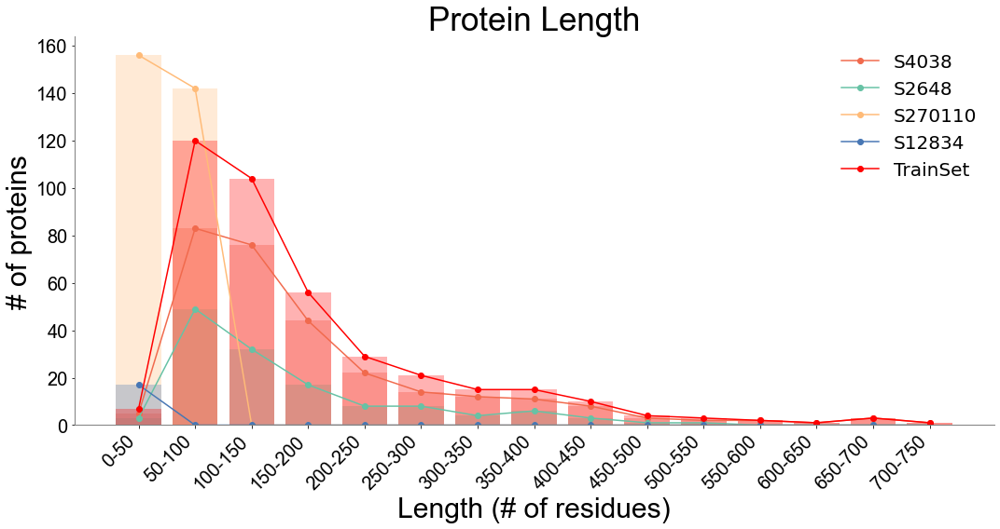

In [96]:
def get_counts(s4038_seq):
    data_lengths = [len(seq) for k,seq in s4038_seq.items()]

    # 定义范围和计数
    ranges = [(i*50, (i+1)*50) for i in range(15)]
    counts = [0] * len(ranges)

    # 计算每个范围内的数据数量
    for length in data_lengths:
        for i, (start, end) in enumerate(ranges):
            if start <= length < end:
                counts[i] += 1
                break
    return ranges,counts
# 假设你已经有了数据，我将数据的长度表示为一个列表
s4038_ranges,s4038_counts = get_counts(s4038_seq)
s2648_ranges,s2648_counts = get_counts(s2648_seq)
mega_ranges,mega_counts = get_counts(mega_seq)
dst_ranges,dst_counts = get_counts(dst_seq)
train_ranges,train_counts = get_counts(s4038_s2648_seq)

# 绘制条形图
plt.figure(figsize=(15, 8))  # 设置图形大小
plt.bar(range(len(s4038_ranges)), s4038_counts, tick_label=[f'{start}-{end}' for start, end in s4038_ranges], alpha=0.3,color='#f16a4d', label='S4038')

plt.bar(range(len(s2648_ranges)), s2648_counts, tick_label=[f'{start}-{end}' for start, end in s2648_ranges], alpha=0.3,color='#67c2a5', label='S2648')
plt.bar(range(len(mega_ranges)), mega_counts, tick_label=[f'{start}-{end}' for start, end in mega_ranges], alpha=0.3,color='#ffbb78', label='S270110')
plt.bar(range(len(dst_ranges)), dst_counts, tick_label=[f'{start}-{end}' for start, end in dst_ranges], alpha=0.3,color='#4877b4', label='S12834')
plt.bar(range(len(train_ranges)), train_counts, tick_label=[f'{start}-{end}' for start, end in train_ranges], alpha=0.3,color='red', label='TrainSet')

# 绘制折线图
plt.plot(range(len(s4038_ranges)), s4038_counts, marker='o', color='#f16a4d', label='S4038')
plt.plot(range(len(s2648_ranges)), s2648_counts, marker='o', color='#67c2a5', label='S2648')
plt.plot(range(len(mega_ranges)), mega_counts, marker='o', color='#ffbb78', label='S270110')
plt.plot(range(len(dst_ranges)), dst_counts, marker='o', color='#4877b4', label='S12834')
plt.plot(range(len(train_ranges)), train_counts, marker='o', color='red', label='TrainSet')



ax = plt.gca()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# 添加图例
# plt.legend(frameon=False,prop={'size': 20})
plt.legend(['S4038', 'S2648', 'S270110', 'S12834', 'TrainSet'], frameon=False, prop={'size': 20})
plt.xlabel('Length (# of residues)',fontsize=30,fontname='Arial')
plt.ylabel('# of proteins',fontsize=30,fontname='Arial')
plt.title('Protein Length',fontsize=35,fontname='Arial')
plt.xticks(fontsize=20,rotation=45,fontname='Arial', ha='right')  # 旋转横坐标标签，使其更易读
plt.yticks(fontsize=20,fontname='Arial', ha='right')  # 旋转横坐标标签，使其更易读
plt.tight_layout()  # 调整布局，防止标签重叠
plt.show()

Figure 3.4，Figure 3.6 属于基本热图，绘制参考本文件其他热图

### Figure 3.5（Figure 3.7）

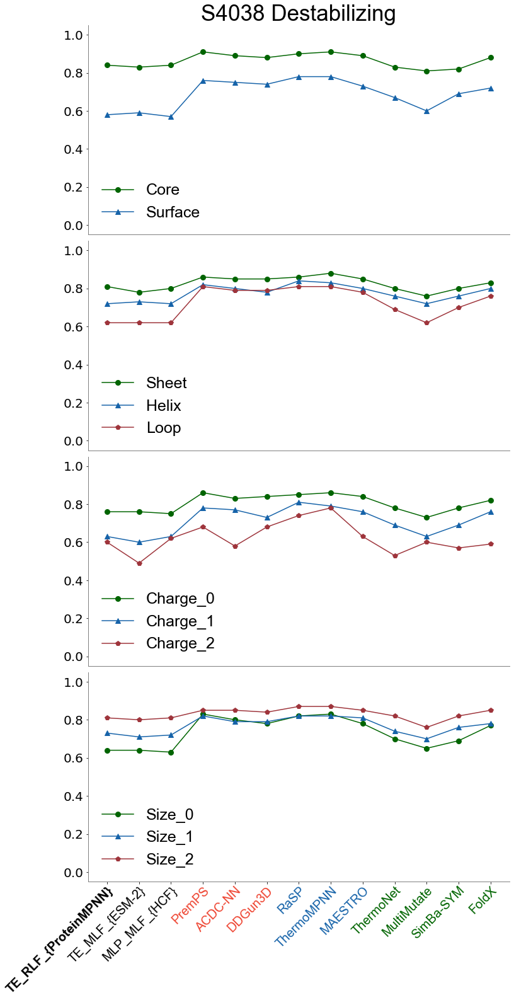

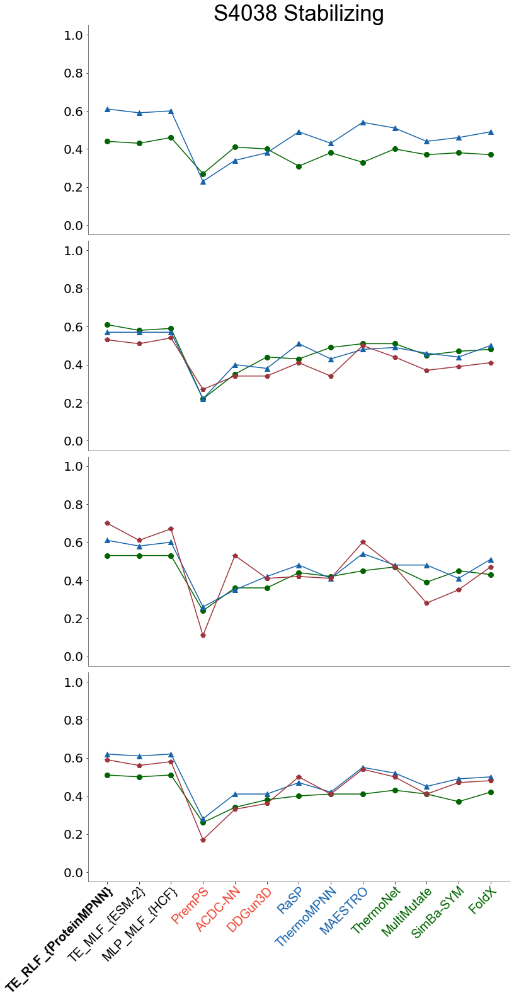

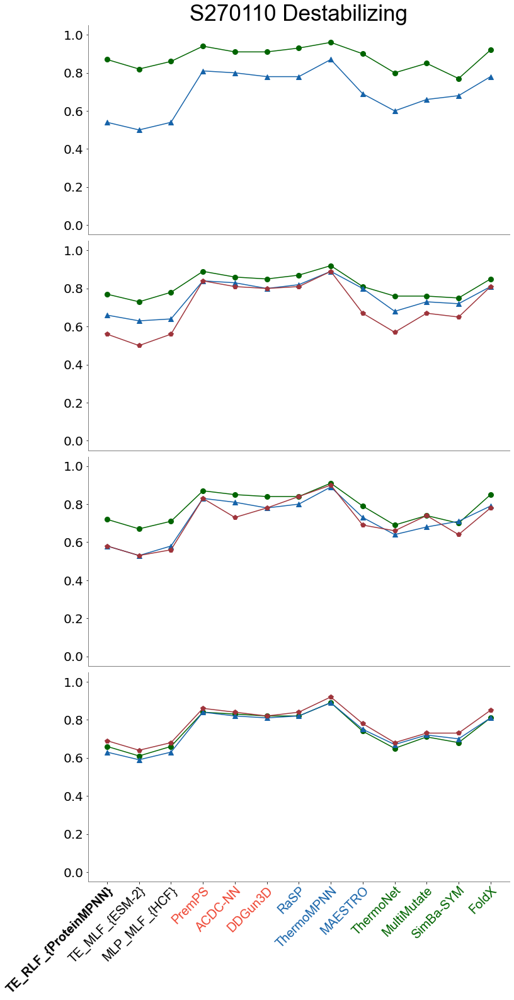

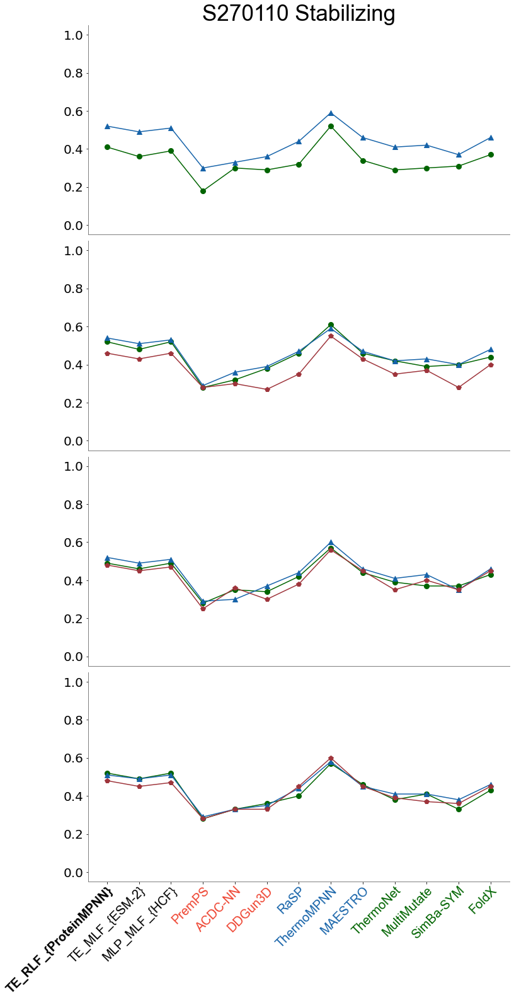

In [99]:
import matplotlib.pyplot as plt
import os
import pandas as pd

desta_method = [ 
 
 'PremPS',
 'ACDC-NN',
 'DDGun3D',
]
sta_method = [ 'ThermoNet',           
 'MultiMutate',
 'SimBa-SYM',
 'FoldX',
 ]
both_method = [ 'RaSP','ThermoMPNN','MAESTRO']

three_color = ['darkgreen','#1663A9','#9e343b']

markersize = 8

file = '~/affi/premps_deep/result_cate_0429_raw_order.txt'

# type_use = ['_R','_sta_R','_desta_R','_sta_TP/P','_desta_TP/P']
data_name = 'S4038'
cut_type = 'Desta._0'
for data_name in ['S4038','S270110']:
    for cut_type in ['Desta._0','Sta._0']:
        for type_use in ['F1']:
            filename = f'{type_use}_{data_name}_{cut_type}'
            b= pd.read_csv(file,header=0,sep='\t')
            method_len = len(b)
            # 创建一个有3个坐标系的画板
            fig, axs = plt.subplots(4, 1, figsize=(12, 25))
            x = np.linspace(1, 15, 15)
            #######################################################################################################
            #Core,Surface
            b=pd.read_csv(file,header=0,sep='\t')
            b['Core']=b[f'{type_use}_{data_name}_Location_Core_{cut_type}']
            b['Surface']=b[f'{type_use}_{data_name}_Location_Surface_{cut_type}']
            b0 = list(b['Core'])
            b1 = list(b['Surface'])
            # 设置不同的颜色和形状
            # line_styles = ['ro-', 'b--']
            # 创建一个有3个坐标系的画板
            x = np.linspace(1, method_len, method_len)
            axs[0].plot(x,b0, label='Core', marker='o',color=three_color[0],markersize=markersize)
            axs[0].plot(x,b1, label='Surface', color=three_color[1],marker='^',markersize=markersize)
            if cut_type.split('.')[0] == 'Desta':
                axs[0].set_title(f'{data_name} Destabilizing', ha='center', va='top',rotation_mode='anchor', fontsize=35,fontname='Arial')
            if cut_type.split('.')[0] == 'Sta':
                axs[0].set_title(f'{data_name} Stabilizing', ha='center', va='top',rotation_mode='anchor', fontsize=35,fontname='Arial')       
            #########################################################################################################
            #Secondary Structure
            a=pd.read_csv(file,header=0,sep='\t')
            a['Sheet']=a[f'{type_use}_{data_name}_Sec-Stru._SHEET_{cut_type}']
            a['Helix']=a[f'{type_use}_{data_name}_Sec-Stru._HELIX_{cut_type}']
            a['Loop']=a[f'{type_use}_{data_name}_Sec-Stru._LOOP_{cut_type}']
            a0 = np.array(list(a['Sheet']))
            a1 = np.array(list(a['Helix']))
            a2 = np.array(list(a['Loop']))
            # 设置不同的颜色和形状
            # line_styles = ['ro-', 'b--', 'g-.']

            axs[1].plot(x,a0, label='Sheet', marker='o',color=three_color[0],markersize=markersize)
            axs[1].plot(x,a1, label='Helix', color=three_color[1],marker='^',markersize=markersize)
            axs[1].plot(x,a2, label='Loop', color=three_color[2],marker='p',markersize=markersize)

            ###################################################################################################
            #conservation
        #     c=pd.read_csv(file,header=0,sep='\t')
        #     c['Conserved']=c[f'Conserved{type_use}']
        #     c['Intermediate']=c[f'Intermediate{type_use}']
        #     c['Variable']=c[f'Variable{type_use}']
        #     c0 = list(c['Conserved'])
        #     c1 = list(c['Intermediate'])
        #     c2 = list(c['Variable'])
        #     # line_styles = ['ro-', 'b--', 'g-.']
        #     x = np.linspace(1, method_len, method_len)
        #     axs[2].plot(x,c0, label='Conserved', marker='o',color=three_color[0],markersize=markersize)
        #     axs[2].plot(x,c1, label='Intermediate', color=three_color[1],marker='^',markersize=markersize)
        #     axs[2].plot(x,c2, label='Variable', color=three_color[2],marker='p',markersize=markersize)

            ######################################################################################################
            #charge_change
            d=pd.read_csv(file,header=0,sep='\t')
            d['Charge_0']=d[f'{type_use}_{data_name}_Charge_0_{cut_type}']
            d['Charge_1']=d[f'{type_use}_{data_name}_Charge_1_{cut_type}']
            d['Charge_2']=d[f'{type_use}_{data_name}_Charge_2_{cut_type}']
            d0 = list(d['Charge_0'])
            d1 = list(d['Charge_1'])
            d2 = list(d['Charge_2'])
            # line_styles = ['ro-', 'b--', 'g-.']
            x = np.linspace(1, method_len, method_len)
            axs[2].plot(x,d0, label='Charge_0', marker='o',color=three_color[0],markersize=markersize)
            axs[2].plot(x,d1, label='Charge_1', color=three_color[1],marker='^',markersize=markersize)
            axs[2].plot(x,d2, label='Charge_2', color=three_color[2],marker='p',markersize=markersize)

            ################################################################################################
            #size change
            e=pd.read_csv(file,header=0,sep='\t')
            e['Size_0']=e[f'{type_use}_{data_name}_Size_0_{cut_type}']
            e['Size_1']=e[f'{type_use}_{data_name}_Size_1_{cut_type}']
            e['Size_2']=e[f'{type_use}_{data_name}_Size_2_{cut_type}']
            e0 = list(e['Size_0'])
            e1 = list(e['Size_1'])
            e2 = list(e['Size_2'])
            # line_styles = ['ro-', 'b--', 'g-.']
            x = np.linspace(1, method_len, method_len)
            axs[3].plot(x,e0, label='Size_0', marker='o',color=three_color[0],markersize=markersize)
            axs[3].plot(x,e1, label='Size_1', color=three_color[1],marker='^',markersize=markersize)
            axs[3].plot(x,e2, label='Size_2', color=three_color[2],marker='p',markersize=markersize)


            x_labels =list(a['Method'])

            # 设置x轴标签颜色
            colors = ['darkgreen','#1663A9','#EE4431','#614099']
            color_list = []
#             for i in x_labels:
#                 if i in methods_ml_str:
#                     color_list.append(colors[0])
#                 elif i in methods_ml_seq:
#                     color_list.append(colors[1])
#                 elif i in methods_noml_str:
#                     color_list.append(colors[2])
#                 elif i in methods_noml_seq:
#                     color_list.append(colors[3])
#                 else:
#                     color_list.append('black')

            for i in x_labels:
                if i in desta_method:
                    color_list.append(colors[2])
                elif i in both_method:
                    color_list.append(colors[1])
                elif i in sta_method:
                    color_list.append(colors[0])
                else:
                    color_list.append('black')
            # 在每个坐标系中绘制折线图
        #     axs[4].set_xticks([i+1 for i in range(method_len)], x_labels,color =color_list,rotation=45,ha='right',fontsize=12)
        #     for ax in axs[:-1]:
        #         ax.set_xticks([])
        #         ax.set_xlabel('')
            # Loop through each subplot and set x-axis labels and colors
        #     for i, ax in enumerate(axs):
        #         if i == 4:
        #             ax.set_xticks([i + 1 for i in range(len(x_labels))])
        #             ax.set_xticklabels(x_labels, rotation=45, ha='right', fontsize=12, color=color_list)
        #             ax.set_xlabel('X-axis Label', fontsize=12)  # Replace 'X-axis Label' with your desired label
        #         else:
        #             ax.set_xticks([])
        #             ax.set_xlabel('')
        # ax = plt.gca()
        # ax.spines['right'].set_visible(False)
        # ax.spines['top'].set_visible(False)

            for i, ax in enumerate(axs):
                ax.spines['right'].set_visible(False)
                ax.spines['top'].set_visible(False)

            # Loop through each subplot and set x-axis labels and colors
            for i, ax in enumerate(axs):
                if i == 3:
                    ax.set_xticks([i+1 for i in range(len(x_labels))])
        
        
        
                    x_labels = [i for i in x_labels]
                    # 设置 x 轴刻度标签
                    ax.set_xticklabels(x_labels, rotation=45, ha='right', va='top', rotation_mode='anchor', fontsize=20, fontname='Arial')

                    # 获取 x 轴刻度标签列表
                    xtick_labels = ax.get_xticklabels()

                    # 假设你想要加粗第三个标签
                    xtick_labels[0].set_fontweight('bold')
                    ax.tick_params(axis='x', pad=1)  # 这里的 pad 值可以根据需要进行调整

        #             ax.set_xlabel('X-axis Label', fontsize=12)  # Replace 'X-axis Label' with your desired label

                    # Set color for each x-axis label
                    for label, color in zip(ax.get_xticklabels(), color_list):
                        label.set_color(color)
                else:
                    ax.set_xticks([])
                    ax.set_xlabel('')

            for i, ax in enumerate(axs):
                ax.tick_params(axis='y', labelsize=20)

            legend_size = 25
            # 定义字体属性
            from matplotlib.font_manager import FontProperties
            legend_font = FontProperties(family='Arial', size=legend_size)

        # 在图例中使用字体属性
            if (data_name == 'S4038') & (cut_type == 'Desta._0'):
                axs[0].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
                axs[1].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
                axs[2].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
                axs[3].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)
        #     axs[4].legend(loc='lower left', frameon=False, fontsize=legend_size, prop=legend_font)

        #     axs[0].text(-0.1, 0.97, 'a', transform=axs[0].transAxes, fontsize=25, fontweight='bold')
        #     axs[1].text(-0.1, 0.97, 'b', transform=axs[1].transAxes, fontsize=25, fontweight='bold')
        #     axs[2].text(-0.1, 0.97, 'c', transform=axs[2].transAxes, fontsize=25, fontweight='bold')
        #     axs[3].text(-0.1, 0.97, 'd', transform=axs[3].transAxes, fontsize=25, fontweight='bold')
        #     axs[4].text(-0.1, 0.97, 'e', transform=axs[4].transAxes, fontsize=25, fontweight='bold')
            

            plt.subplots_adjust(hspace=0.03, wspace=0.1)
            for ax in axs:
                ax.set_ylim(-0.05,1.05)
        #     axs[3].set_ylim(-0.72,0.7)

            # 调整布局和间距
            # plt.tight_layout(rect=[0, 0, 0.95, 1], h_pad=0.02)

            # 显示图形
#             plt.savefig(fr'/data/jiang/affi/premps_deep/result/240506/{filename}.png', dpi=300,bbox_inches='tight')

